In [ ]:
# Step 1: Unmount Google Drive (if already mounted)
from google.colab import drive
# Step 3: Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install rasterio scikit-image


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 74.8 MB/s eta 0:00:00


Code for Extraction Data frim GEE

In [ ]:
// --- Define Area of Interest (Manipur) ---
var manipur = ee.FeatureCollection('FAO/GAUL/2015/level1')
              .filter(ee.Filter.eq('ADM1_NAME', 'Manipur'));

// --- Define Time Range for Analysis ---
var startDate = '2016-01-01';  // Adjust as needed
var endDate = '2024-12-31';

// --- Load Sentinel-2 Dataset and Filter it ---
var bands = ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B9', 'B11', 'B12']; // Exclude non-consistent bands

var sentinel = ee.ImageCollection('COPERNICUS/S2')
    .filterBounds(manipur)
    .filterDate(startDate, endDate)
    .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 10)) // Filter for <10% cloud cover
    .select(bands) // Keep only essential bands
    .median() // Reduce to a single representative image

// --- Calculate NDVI (Normalized Difference Vegetation Index) ---
var ndvi = sentinel.normalizedDifference(['B8', 'B4']).rename('NDVI');

// --- Calculate NDWI (Normalized Difference Water Index) ---
var ndwi = sentinel.normalizedDifference(['B3', 'B8']).rename('NDWI');

// --- Create a Combined Image ---
var result = ndvi.addBands(ndwi).clip(manipur);

// --- Export NDVI & NDWI as Image to Google Drive ---
Export.image.toDrive({
  image: result,
  description: 'Manipur_NDVI_NDWI',
  folder: 'GEE_Exports',
  fileNamePrefix: 'Manipur_NDVI_NDWI',
  scale: 30,
  region: manipur.geometry(),

  maxPixels: 1e9 // Increase to handle large area
});

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model

def dice_loss(y_true, y_pred):
    numerator = 2 * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    return 1 - numerator / denominator

def conv_block(x, filters, kernel_size=(3, 3), padding='same', activation='relu'):
    x = layers.Conv2D(filters, kernel_size, padding=padding)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation(activation)(x)
    x = layers.Conv2D(filters, kernel_size, padding=padding)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation(activation)(x)
    return x

def encoder_block(x, filters, kernel_size=(3, 3), padding='same', activation='relu'):
    x = conv_block(x, filters, kernel_size, padding, activation)
    p = layers.MaxPooling2D((2, 2))(x)
    return x, p

def decoder_block(x, skip, filters, kernel_size=(3, 3), padding='same', activation='relu'):
    x = layers.Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding=padding)(x)
    x = layers.concatenate([x, skip])
    x = conv_block(x, filters, kernel_size, padding, activation)
    return x

def unet_model(input_shape=(256, 256, 4)):
    inputs = layers.Input(input_shape)

    # Encoder
    c1, p1 = encoder_block(inputs, 64)
    c2, p2 = encoder_block(p1, 128)
    c3, p3 = encoder_block(p2, 256)
    c4, p4 = encoder_block(p3, 512)

    # Bottleneck
    c5 = conv_block(p4, 1024)
    c5 = layers.Dropout(0.3)(c5)  # Dropout to prevent overfitting

    # Decoder
    u6 = decoder_block(c5, c4, 512)
    u7 = decoder_block(u6, c3, 256)
    u8 = decoder_block(u7, c2, 128)
    u9 = decoder_block(u8, c1, 64)

    # Output
    outputs = layers.Conv2D(2, (1, 1), activation='softmax')(u9)  # Two classes (Change/No Change)

    model = Model(inputs, outputs)
    return model

# Create and compile U-Net model
model = unet_model()
model.compile(optimizer='adam', loss=dice_loss, metrics=['accuracy'])

# Display model summary
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 4)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 64)   │          2,368 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 256, 256, 64)   │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 256, 256, 64)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 64)   │         36,928 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 256, 256, 64)   │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 256, 256, 64)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 64)   │              0 │ activation_1[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 128, 128, 128)  │            512 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 128, 128, 128)  │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 128, 128, 128)  │        147,584 │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 128, 128, 128)  │            512 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 128, 128, 128)  │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 64, 64, 128)    │              0 │ activation_3[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 64, 64, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4

 Total params: 31,055,938 (118.47 MB)

 Trainable params: 31,044,162 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

**Cleaning Data Extracted From GEE**


Mounted at /content/drive


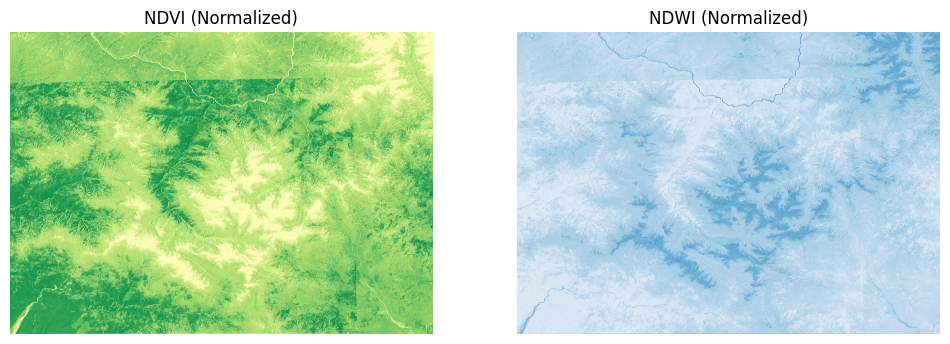

✅ Preprocessing complete. Cleaned data saved!


In [ ]:
import rasterio
from google.colab import drive
import os

drive.mount('/content/drive',force_remount=True)

import numpy as np
import matplotlib.pyplot as plt

# Load the NDVI & NDWI TIFF file
file_path = "/content/drive/My Drive/Data/NDVI_NDWI_Namdapha_National_Park.tif"

with rasterio.open(file_path) as src:
    ndvi = src.read(1)  # Band 1 (NDVI)
    ndwi = src.read(2)  # Band 2 (NDWI)
    profile = src.profile

# --- Step 1: Cloud Masking ---
# Assuming cloud pixels have extreme NDVI/NDWI values or NaN values
cloud_mask = (np.isnan(ndvi)) | (np.isnan(ndwi))

# Apply cloud mask
ndvi[cloud_mask] = np.nan  # Mark cloud pixels as NaN
ndwi[cloud_mask] = np.nan  # Mark cloud pixels as NaN

# --- Step 2: Remove NaN Values & Clip Ranges ---
ndvi = np.nan_to_num(ndvi, nan=0)  # Replace NaN with 0
ndwi = np.nan_to_num(ndwi, nan=0)  # Replace NaN with 0

# Clip NDVI and NDWI to valid ranges
ndvi = np.clip(ndvi, -1, 1)
ndwi = np.clip(ndwi, -1, 1)

# --- Step 3: Normalize Data (0 to 1) ---
ndvi_norm = (ndvi + 1) / 2  # Normalize NDVI (Range: -1 to 1 → 0 to 1)
ndwi_norm = (ndwi + 1) / 2  # Normalize NDWI (Range: -1 to 1 → 0 to 1)

# --- Step 4: Save Cleaned Data ---


output_path_ndvi = "/content/drive/My Drive/Pre/Namd_NDVI_Cleaned.tif"
output_path_ndwi = "/content/drive/My Drive/Pre/Namd_NDWI_Cleaned.tif"

# Save cleaned NDVI
profile.update(dtype="float32")
with rasterio.open(output_path_ndvi, "w", **profile) as dst:
    dst.write(ndvi_norm, 1)

# Save cleaned NDWI
with rasterio.open(output_path_ndwi, "w", **profile) as dst:
    dst.write(ndwi_norm, 1)

# --- Step 5: Visualization ---
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Plot NDVI
ax[0].imshow(ndvi_norm, cmap="RdYlGn", vmin=0, vmax=1)
ax[0].set_title("NDVI (Normalized)")
ax[0].axis("off")

# Plot NDWI
ax[1].imshow(ndwi_norm, cmap="Blues", vmin=0, vmax=1)
ax[1].set_title("NDWI (Normalized)")
ax[1].axis("off")

plt.show()

print("✅ Preprocessing complete. Cleaned data saved!")


**Compute Statistic of Clean Data**


In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Define file path
tiff_path = "/content/drive/My Drive/Data/NDVI_NDWI_Namdapha_National_Park.tif"
# Open the TIFF file and read data

# Provide the file paths for your preprocessed NDVI and NDWI images
ndvi_path = "/content/drive/My Drive/Pre/Namd_NDVI_Cleaned.tif"
ndwi_path = "/content/drive/My Drive/Pre/Namd_NDWI_Cleaned.tif"

# Function to compute statistics
def compute_stats(image_path, label):
    with rasterio.open(image_path) as dataset:
        image = dataset.read(1)  # Read the first band

    min_val = np.min(image)
    max_val = np.max(image)
    mean_val = np.mean(image)

    print(f"{label} - Min: {min_val:.6f}, Max: {max_val:.6f}, Mean: {mean_val:.6f}")

# Compute stats for NDVI and NDWI
compute_stats(ndvi_path, "NDVI")
compute_stats(ndwi_path, "NDWI")

Mounted at /content/drive
NDVI - Min: 0.282051, Max: 0.958368, Mean: 0.720010
NDWI - Min: 0.069750, Max: 0.792376, Mean: 0.294225


Unnecessary Step(Augmented)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Augmentation complete. Files saved in Google Drive.


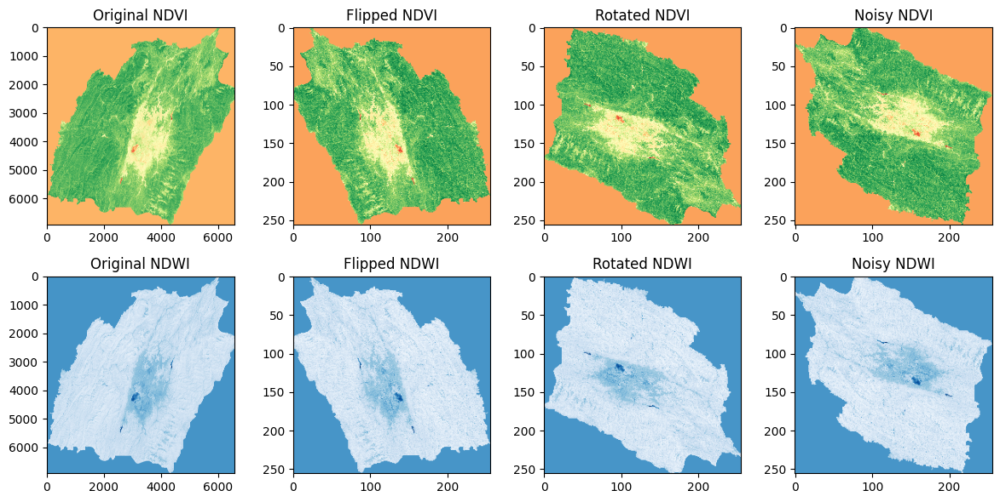

In [ ]:
import os
import numpy as np
import cv2
import rasterio
import random
import matplotlib.pyplot as plt
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define paths
data_path = "/content/drive/MyDrive/Pre"  # Update if needed
augmented_path = "/content/drive/MyDrive/augmented_data"
os.makedirs(augmented_path, exist_ok=True)

# Function to load raster data
def load_raster(file_path):
    with rasterio.open(file_path) as src:
        return src.read(1).astype(np.float32)  # Extract first band

# Load cleaned NDVI & NDWI files
ndvi = load_raster(os.path.join(data_path, "Manipur_NDVI_Cleaned.tif"))
ndwi = load_raster(os.path.join(data_path, "Manipur_NDWI_Cleaned.tif"))

# Normalize data (0 to 1)
ndvi = (ndvi - np.min(ndvi)) / (np.max(ndvi) - np.min(ndvi))
ndwi = (ndwi - np.min(ndwi)) / (np.max(ndwi) - np.min(ndwi))

# Convert to NumPy arrays
ndvi_data = np.expand_dims(ndvi, axis=0)  # Add batch dimension
ndwi_data = np.expand_dims(ndwi, axis=0)

# Skip splitting and use the entire dataset for augmentation
ndvi_train, ndvi_test = ndvi_data, None
ndwi_train, ndwi_test = ndwi_data, None

# Function to apply data augmentation
def augment_image(image, target_size=(256, 256)):
    augmented_images = []

    # Original
    augmented_images.append(cv2.resize(image, target_size))  # Resize to target size

    # Flipping
    flipped_h = cv2.flip(image, 1)  # Horizontal flip
    augmented_images.append(cv2.resize(flipped_h, target_size))  # Resize to target size
    flipped_v = cv2.flip(image, 0)  # Vertical flip
    augmented_images.append(cv2.resize(flipped_v, target_size))  # Resize to target size

    # Rotation
    for angle in [90, 180, 270]:
        rotated = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE if angle == 90
                                     else cv2.ROTATE_180 if angle == 180
                                     else cv2.ROTATE_90_COUNTERCLOCKWISE)
        augmented_images.append(cv2.resize(rotated, target_size))  # Resize to target size

    # Adding Gaussian noise
    noise = np.random.normal(0, 0.05, image.shape)  # Mean=0, Std=0.05
    noisy_image = np.clip(image + noise, 0, 1)
    augmented_images.append(cv2.resize(noisy_image, target_size))  # Resize to target size

    return augmented_images

# Apply augmentation on training set
augmented_ndvi, augmented_ndwi = [], []

for i in range(len(ndvi_train)):
    augmented_ndvi.extend(augment_image(ndvi_train[i]))
    augmented_ndwi.extend(augment_image(ndwi_train[i]))

# Convert to numpy arrays
augmented_ndvi = np.array(augmented_ndvi)
augmented_ndwi = np.array(augmented_ndwi)

# Save datasets to Drive
np.save(os.path.join(augmented_path, "augmented_NDVI.npy"), augmented_ndvi)
np.save(os.path.join(augmented_path, "augmented_NDWI.npy"), augmented_ndwi)

print("✅ Augmentation complete. Files saved in Google Drive.")

# Plot original vs augmented images
fig, axes = plt.subplots(2, 4, figsize=(12, 6))

# NDVI examples
axes[0, 0].imshow(ndvi_train[0], cmap='RdYlGn')
axes[0, 0].set_title("Original NDVI")
axes[0, 1].imshow(augmented_ndvi[1], cmap='RdYlGn')
axes[0, 1].set_title("Flipped NDVI")
axes[0, 2].imshow(augmented_ndvi[3], cmap='RdYlGn')
axes[0, 2].set_title("Rotated NDVI")
axes[0, 3].imshow(augmented_ndvi[5], cmap='RdYlGn')
axes[0, 3].set_title("Noisy NDVI")

# NDWI examples
axes[1, 0].imshow(ndwi_train[0], cmap='Blues')
axes[1, 0].set_title("Original NDWI")
axes[1, 1].imshow(augmented_ndwi[1], cmap='Blues')
axes[1, 1].set_title("Flipped NDWI")
axes[1, 2].imshow(augmented_ndwi[3], cmap='Blues')
axes[1, 2].set_title("Rotated NDWI")
axes[1, 3].imshow(augmented_ndwi[5], cmap='Blues')
axes[1, 3].set_title("Noisy NDWI")

plt.tight_layout()
plt.show()

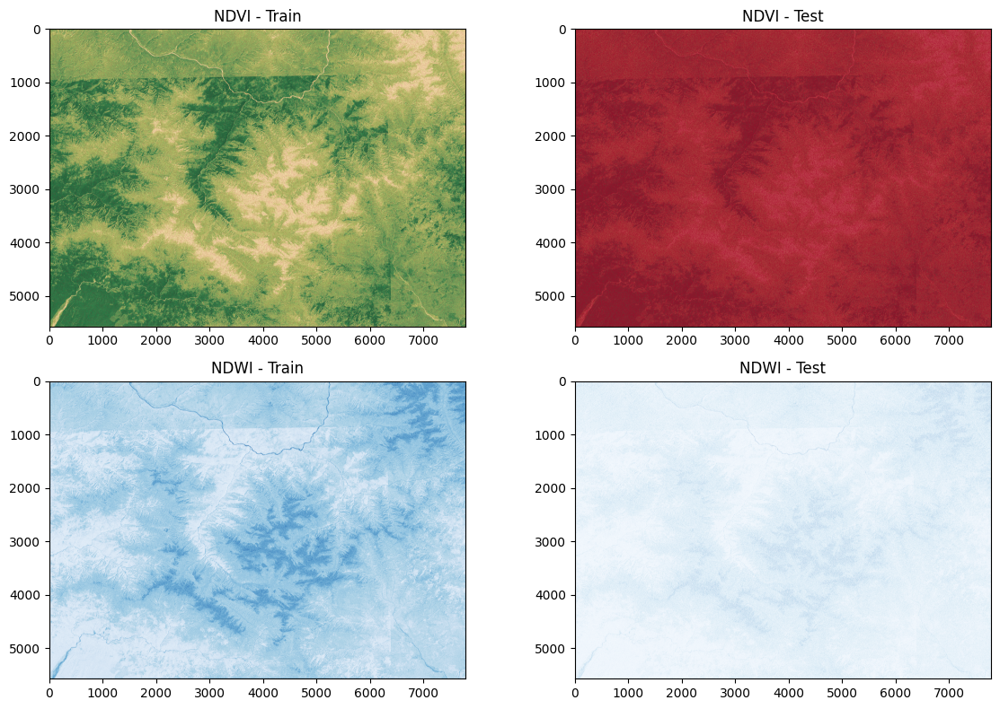

In [ ]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Load NDVI and NDWI data
ndvi_path = "/content/drive/MyDrive/Pre/Namd_NDVI_Cleaned.tif"
ndwi_path = "/content/drive/MyDrive/Pre/Namd_NDWI_Cleaned.tif"

with rasterio.open(ndvi_path) as src:
    ndvi = src.read(1)  # Read the first band
    profile = src.profile  # Store metadata

with rasterio.open(ndwi_path) as src:
    ndwi = src.read(1)

# Get image dimensions
height, width = ndvi.shape

# Generate random mask for splitting
np.random.seed(42)
mask = np.random.rand(height, width) < 0.8  # 80% Train, 20% Test

# Apply mask
ndvi_train, ndvi_test = ndvi.copy(), ndvi.copy()
ndwi_train, ndwi_test = ndwi.copy(), ndwi.copy()

ndvi_train[~mask] = 0  # Set test pixels to 0 in train data
ndvi_test[mask] = 0  # Set train pixels to 0 in test data

ndwi_train[~mask] = 0
ndwi_test[mask] = 0

# Plot
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

axs[0, 0].imshow(ndvi_train, cmap="RdYlGn")
axs[0, 0].set_title("NDVI - Train")

axs[0, 1].imshow(ndvi_test, cmap="RdYlGn")
axs[0, 1].set_title("NDVI - Test")

axs[1, 0].imshow(ndwi_train, cmap="Blues")
axs[1, 0].set_title("NDWI - Train")

axs[1, 1].imshow(ndwi_test, cmap="Blues")
axs[1, 1].set_title("NDWI - Test")

plt.tight_layout()
plt.show()


Extraction Of Change Map From Clean Data

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Change Map saved at: /content/drive/MyDrive/Change_Maps/Namd_Change_Map.tif


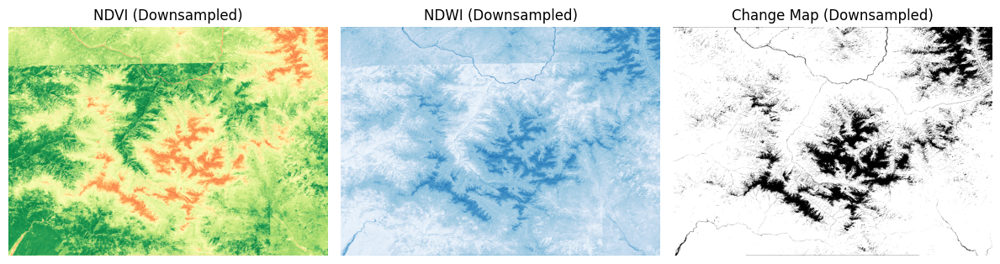

In [ ]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define paths
data_path = "/content/drive/MyDrive/Pre"  # Folder containing cleaned NDVI & NDWI
save_path = "/content/drive/MyDrive/Change_Maps"
os.makedirs(save_path, exist_ok=True)

# Function to load raster data
def load_raster(file_path):
    with rasterio.open(file_path) as src:
        return src.read(1).astype(np.float32), src.profile  # Extract first band and metadata

# Load NDVI & NDWI cleaned data
ndvi, ndvi_profile = load_raster(os.path.join(data_path, "Namd_NDVI_Cleaned.tif"))
ndwi, ndwi_profile = load_raster(os.path.join(data_path, "Namd_NDWI_Cleaned.tif"))

# Compute Change Map
diff_map = np.abs(ndvi - ndwi)  # Absolute difference

# Apply thresholding (Highlight significant changes)
threshold = 0.2  # Adjust based on analysis
change_map = (diff_map > threshold).astype(np.float32)

# Normalize Change Map
change_map = (change_map - np.min(change_map)) / (np.max(change_map) - np.min(change_map))




# Save Change Map
change_map_path = os.path.join(save_path, "Namd_Change_Map.tif")
with rasterio.open(change_map_path, 'w', **ndvi_profile) as dst:
    dst.write(change_map, 1)

print(f'✅ Change Map saved at: {change_map_path}')

# Reduce image size for visualization (downsampling by factor of 4)
from skimage.transform import resize
ndvi_resized = resize(ndvi, (ndvi.shape[0] // 4, ndvi.shape[1] // 4), anti_aliasing=True)
ndwi_resized = resize(ndwi, (ndwi.shape[0] // 4, ndwi.shape[1] // 4), anti_aliasing=True)

change_map_resized = change_map[::4, ::4]  # ✅ Fix applied here

# Plot NDVI, NDWI, and Change Map
fig, axes = plt.subplots(1, 3, figsize=(12, 4))  # Reduce figure size

axes[0].imshow(ndvi_resized, cmap='RdYlGn')
axes[0].set_title("NDVI (Downsampled)")
axes[0].axis("off")

axes[1].imshow(ndwi_resized, cmap='Blues')
axes[1].set_title("NDWI (Downsampled)")
axes[1].axis("off")

axes[2].imshow(change_map_resized, cmap='gray')
axes[2].set_title("Change Map (Downsampled)")
axes[2].axis("off")

plt.tight_layout()
plt.show()



Plotting


In [ ]:
print("NDVI NaNs:", np.isnan(ndvi).sum(), " | NDWI NaNs:", np.isnan(ndwi).sum())
print("NDVI Min-Max:", ndvi.min(), ndvi.max())
print("NDWI Min-Max:", ndwi.min(), ndwi.max())


NDVI NaNs: 0  | NDWI NaNs: 0
NDVI Min-Max: 0.4129412 0.9544219
NDWI Min-Max: 0.07992789 0.6379577


**Dataset Creation for training Of large Data**

In [ ]:
import os
import numpy as np
import rasterio
from sklearn.model_selection import train_test_split
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Paths
DATA_PATH = "/content/drive/MyDrive/Pre/"
Change_map = "/content/drive/MyDrive/Change_Maps/"
Save = "/content/drive/MyDrive/DataSet/"
NDVI_FILE = os.path.join(DATA_PATH, "Namd_NDVI_Cleaned.tif")
NDWI_FILE = os.path.join(DATA_PATH, "Namd_NDWI_Cleaned.tif")
CHANGE_MAP_FILE = os.path.join(Change_map, "Namd_Change_Map.tif")

# Create dataset folder
os.makedirs(Save, exist_ok=True)

# Function to extract patches directly from disk
def extract_patches_from_disk(image_path, patch_size=256):
    patches = []
    with rasterio.open(image_path) as src:
        height, width = src.shape
        for i in range(0, height, patch_size):
            for j in range(0, width, patch_size):
                window = rasterio.windows.Window(j, i, patch_size, patch_size)
                patch = src.read(1, window=window)
                if patch.shape == (patch_size, patch_size):  # Ensure valid patch
                    patches.append(patch)
    return np.array(patches)

# Extract patches
ndvi_patches = extract_patches_from_disk(NDVI_FILE)
ndwi_patches = extract_patches_from_disk(NDWI_FILE)
change_map_patches = extract_patches_from_disk(CHANGE_MAP_FILE)

# Normalize NDVI & NDWI patches (patch-wise)
ndvi_patches = (ndvi_patches - np.min(ndvi_patches)) / (np.max(ndvi_patches) - np.min(ndvi_patches))
ndwi_patches = (ndwi_patches - np.min(ndwi_patches)) / (np.max(ndwi_patches) - np.min(ndwi_patches))

# Stack NDVI & NDWI
X = np.stack([ndvi_patches, ndwi_patches], axis=-1)
Y = (change_map_patches > 0).astype(np.uint8)  # Binary mask

# Free memory before train-test split
del ndvi_patches, ndwi_patches, change_map_patches

# Split dataset
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Save dataset using np.memmap (efficient for large arrays)
np.save(os.path.join(Save, "Namd_train_NDVI_NDWI.npy"), X_train)
np.save(os.path.join(Save, "Namd_train_change_maps.npy"), Y_train)
np.save(os.path.join(Save, "Namd_test_NDVI_NDWI.npy"), X_test)
np.save(os.path.join(Save, "Namd_test_change_maps.npy"), Y_test)

print("Dataset generation complete! Data saved in:", Save)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dataset generation complete! Data saved in: /content/drive/MyDrive/DataSet/


Shape Check Of Training Data

In [ ]:
import numpy as np

# Load dataset
dataset_path = "/content/drive/MyDrive/DataSet/"

X_train = np.load(dataset_path + "Namd_train_NDVI_NDWI.npy")
Y_train = np.load(dataset_path + "Namd_train_change_maps.npy")
X_test = np.load(dataset_path + "Namd_test_NDVI_NDWI.npy")
Y_test = np.load(dataset_path + "Namd_test_change_maps.npy")

# Print shapes
print("X_train shape:", X_train.shape)  # Expected: (num_patches, 256, 256, 2)
print("Y_train shape:", Y_train.shape)  # Expected: (num_patches, 256, 256, 1)
print("X_test shape:", X_test.shape)    # Expected: (num_patches, 256, 256, 2)
print("Y_test shape:", Y_test.shape)    # Expected: (num_patches, 256, 256, 1))


X_train shape: (504, 256, 256, 2)
Y_train shape: (504, 256, 256)
X_test shape: (126, 256, 256, 2)
Y_test shape: (126, 256, 256)


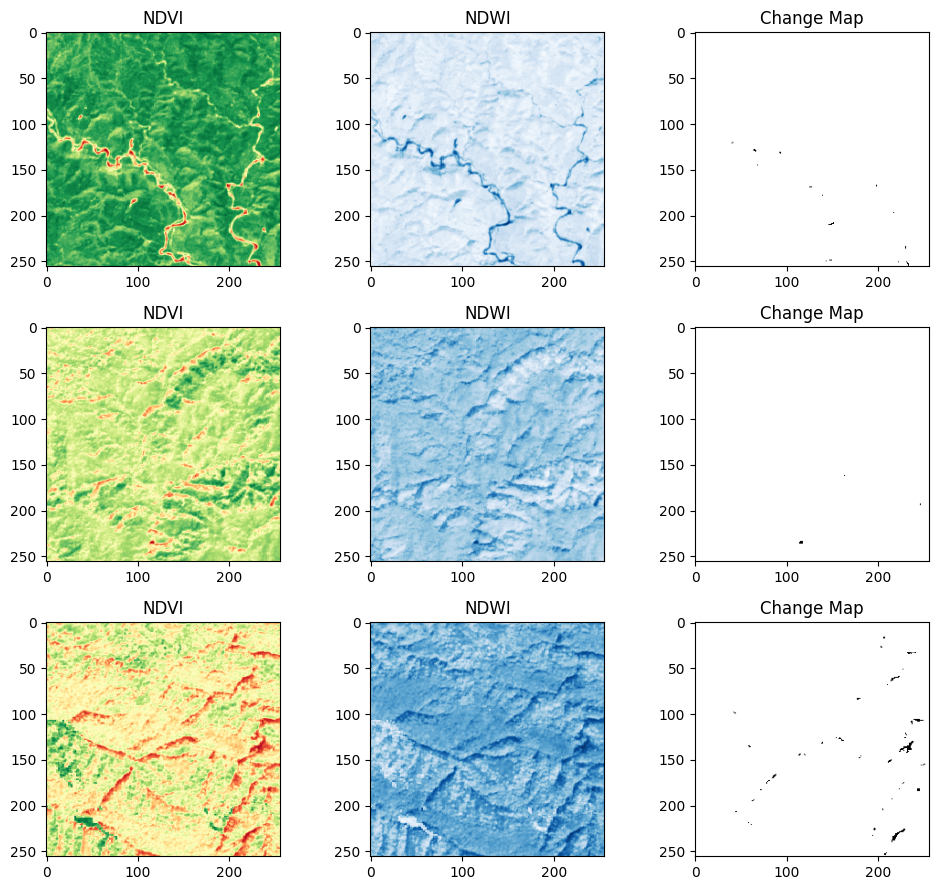

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define dataset path
SAVE_PATH = "/content/drive/MyDrive/DataSet/"

# Load the dataset
X_train = np.load(SAVE_PATH + "Pakke_train_NDVI_NDWI.npy")
Y_train = np.load(SAVE_PATH + "Pakke_train_change_maps.npy")

# Select random samples
num_samples = 3  # Number of samples to visualize
indices = np.random.choice(len(X_train), num_samples, replace=False)

# Plot samples
fig, axes = plt.subplots(num_samples, 3, figsize=(10, num_samples * 3))

for i, idx in enumerate(indices):
    ndvi = X_train[idx, :, :, 0]
    ndwi = X_train[idx, :, :, 1]
    change_map = Y_train[idx, :, :]

    axes[i, 0].imshow(ndvi, cmap="RdYlGn")
    axes[i, 0].set_title("NDVI")

    axes[i, 1].imshow(ndwi, cmap="Blues")
    axes[i, 1].set_title("NDWI")

    axes[i, 2].imshow(change_map, cmap="gray")
    axes[i, 2].set_title("Change Map")

plt.tight_layout()
plt.show()


Training Model

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model
import numpy as np
import os

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Load the model
modelsav="/content/drive/MyDrive/models/"
model_path = "/content/drive/MyDrive/models/unet_Pakke_trained_final.h5"
model = load_model(model_path)

# Dataset paths
train_input_path = "/content/drive/MyDrive/DataSet/Namd_train_NDVI_NDWI.npy"
train_labels_path = "/content/drive/MyDrive/DataSet/Namd_train_change_maps.npy"
test_input_path = "/content/drive/MyDrive/DataSet/Namd_test_NDVI_NDWI.npy"
test_labels_path = "/content/drive/MyDrive/DataSet/Namd_test_change_maps.npy"

# Load dataset
X_train = np.load(train_input_path)
Y_train = np.load(train_labels_path)
X_test = np.load(test_input_path)
Y_test = np.load(test_labels_path)

# Fix label shape (Add an extra dimension)
#Y_train = np.expand_dims(Y_train, axis=-1)  # Shape becomes (num_samples, 256, 256, 1)
#Y_test = np.expand_dims(Y_test, axis=-1)    # Shape becomes (num_samples, 256, 256, 1)

# Training parameters
batch_size = 4
epochs = 50
learning_rate = 1e-4

# Compile model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss="binary_crossentropy",
              metrics=["accuracy"])

# Convert to TensorFlow Dataset for efficiency
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, Y_train)).batch(batch_size).prefetch(tf.data.AUTOTUNE)
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, Y_test)).batch(batch_size).prefetch(tf.data.AUTOTUNE)

checkpoint_path = os.path.join(modelsav, "unet_Namd_checkpoint.h5")

# Train the model
history = model.fit(train_dataset,
                    validation_data=test_dataset,
                    epochs=epochs,
                    callbacks=[
                        tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
                        tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path, save_best_only=True)
                    ])

# Save the trained model
final_model_path = os.path.join(modelsav, "unet_Namd_trained_final.h5")
model.save(final_model_path)

print(f"Final model saved to: {final_model_path}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - accuracy: 0.9661 - loss: 0.2055

126/126 ━━━━━━━━━━━━━━━━━━━━ 40s 218ms/step - accuracy: 0.9662 - loss: 0.2046 - val_accuracy: 0.9945 - val_loss: 0.0170
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.9949 - loss: 0.0131

126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - accuracy: 0.9949 - loss: 0.0131 - val_accuracy: 0.9968 - val_loss: 0.0094
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - accuracy: 0.9966 - loss: 0.0085

126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 167ms/step - accuracy: 0.9966 - loss: 0.0085 - val_accuracy: 0.9975 - val_loss: 0.0069
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.9973 - loss: 0.0067

126/126 ━━━━━━━━━━━━━━━━━━━━ 24s 190ms/step - accuracy: 0.9973 - loss: 0.0067 - val_accuracy: 0.9980 - val_loss: 0.0055
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - accuracy: 0.9977 - loss: 0.0058

126/126 ━━━━━━━━━━━━━━━━━━━━ 22s 171ms/step - accuracy: 0.9977 - loss: 0.0058 - val_accuracy: 0.9981 - val_loss: 0.0050
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.9978 - loss: 0.0054

126/126 ━━━━━━━━━━━━━━━━━━━━ 22s 177ms/step - accuracy: 0.9978 - loss: 0.0054 - val_accuracy: 0.9980 - val_loss: 0.0049
Epoch 7/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - accuracy: 0.9979 - loss: 0.0051

126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 167ms/step - accuracy: 0.9979 - loss: 0.0051 - val_accuracy: 0.9980 - val_loss: 0.0047
Epoch 8/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - accuracy: 0.9980 - loss: 0.0049

126/126 ━━━━━━━━━━━━━━━━━━━━ 41s 168ms/step - accuracy: 0.9980 - loss: 0.0049 - val_accuracy: 0.9981 - val_loss: 0.0045
Epoch 9/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - accuracy: 0.9980 - loss: 0.0048

126/126 ━━━━━━━━━━━━━━━━━━━━ 22s 176ms/step - accuracy: 0.9980 - loss: 0.0048 - val_accuracy: 0.9982 - val_loss: 0.0044
Epoch 10/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.9981 - loss: 0.0047

126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - accuracy: 0.9981 - loss: 0.0047 - val_accuracy: 0.9983 - val_loss: 0.0042
Epoch 11/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - accuracy: 0.9981 - loss: 0.0046

126/126 ━━━━━━━━━━━━━━━━━━━━ 22s 174ms/step - accuracy: 0.9981 - loss: 0.0046 - val_accuracy: 0.9984 - val_loss: 0.0040
Epoch 12/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.9981 - loss: 0.0045

126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - accuracy: 0.9981 - loss: 0.0045 - val_accuracy: 0.9985 - val_loss: 0.0038
Epoch 13/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.9981 - loss: 0.0044

126/126 ━━━━━━━━━━━━━━━━━━━━ 41s 170ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.9987 - val_loss: 0.0036
Epoch 14/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.9982 - loss: 0.0044

126/126 ━━━━━━━━━━━━━━━━━━━━ 41s 171ms/step - accuracy: 0.9982 - loss: 0.0044 - val_accuracy: 0.9987 - val_loss: 0.0035
Epoch 15/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - accuracy: 0.9982 - loss: 0.0043

126/126 ━━━━━━━━━━━━━━━━━━━━ 22s 172ms/step - accuracy: 0.9982 - loss: 0.0043 - val_accuracy: 0.9987 - val_loss: 0.0035
Epoch 16/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - accuracy: 0.9982 - loss: 0.0042 - val_accuracy: 0.9987 - val_loss: 0.0035
Epoch 17/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - accuracy: 0.9983 - loss: 0.0042 - val_accuracy: 0.9986 - val_loss: 0.0036
Epoch 18/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.9985 - val_loss: 0.0037
Epoch 19/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 42s 171ms/step - accuracy: 0.9983 - loss: 0.0041 - val_accuracy: 0.9982 - val_loss: 0.0042
Epoch 20/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - accuracy: 0.9982 - loss: 0.0043 - val_accuracy: 0.9976 - val_loss: 0.0053


Final model saved to: /content/drive/MyDrive/models/unet_Namd_trained_final.h5


Model training Related Data


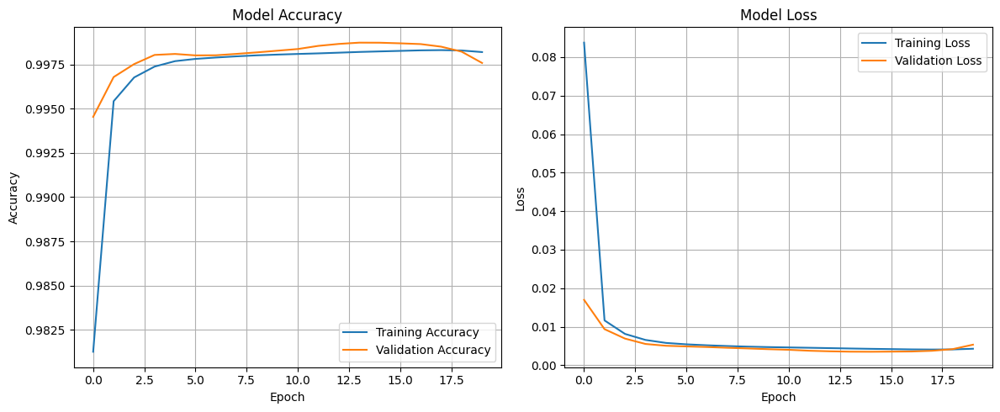

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.grid()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.grid()

plt.tight_layout()
plt.show()

Evaluating Model-Confusion Matrix


```
# This is formatted as code
```



3/3 ━━━━━━━━━━━━━━━━━━━━ 30s 4s/step
IoU Score: 0.9694
Dice Score (F1): 0.9845
Precision: 0.9967
Recall: 0.9726


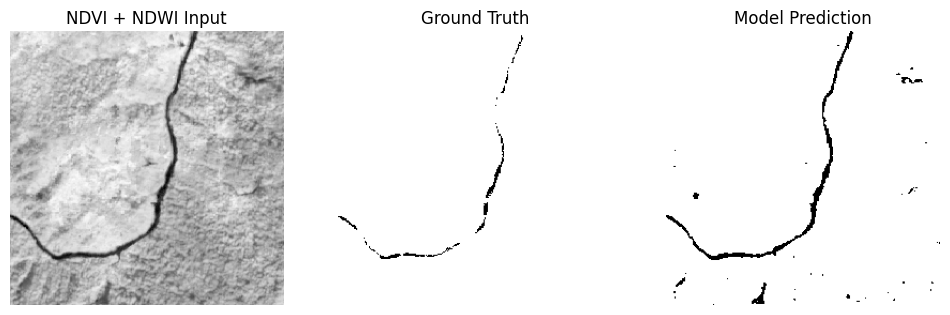

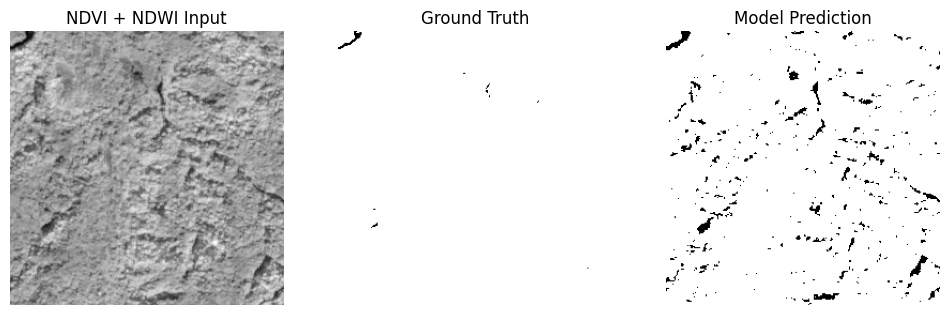

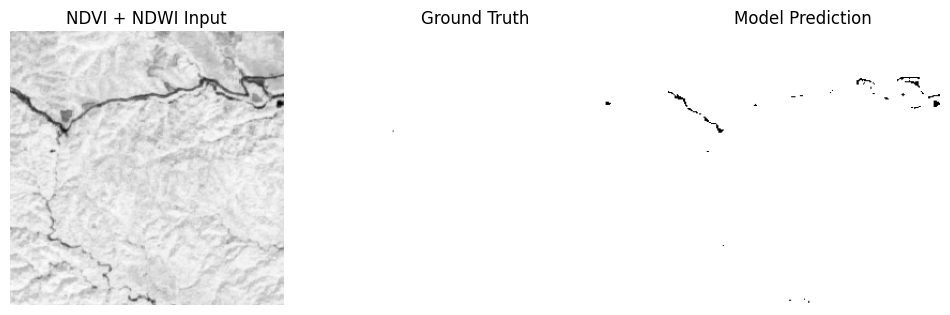

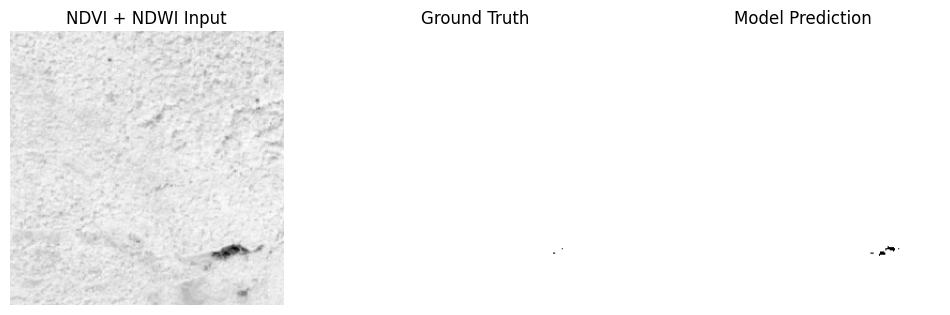

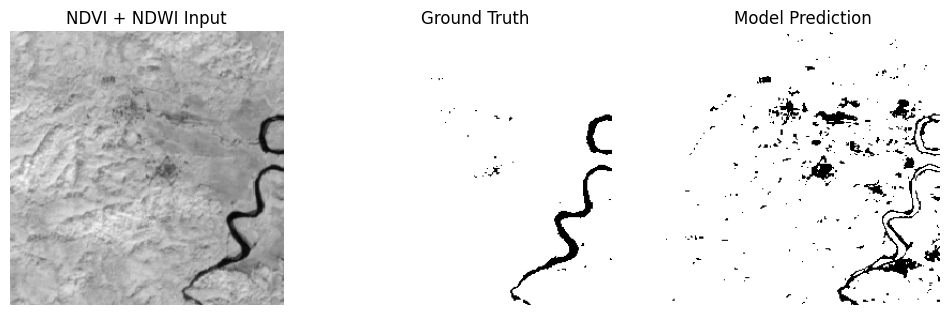

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.metrics import jaccard_score, f1_score, precision_score, recall_score

# Paths to model & dataset
model_path = "/content/drive/MyDrive/models/unet_Namd_trained_final.h5"
test_input_path = "/content/drive/MyDrive/DataSet/Pakke_test_NDVI_NDWI.npy"
test_labels_path = "/content/drive/MyDrive/DataSet/Pakke_test_change_maps.npy"

# Load model
model = tf.keras.models.load_model(model_path)

# Load test data
test_inputs = np.load(test_input_path)
test_labels = np.load(test_labels_path)

# Normalize inputs
test_inputs = test_inputs.astype('float32') / 1.0  # Ensure scaling consistency

# Model prediction
predictions = model.predict(test_inputs)
predictions = (predictions > 0.5).astype(np.uint8)  # Convert to binary mask

# Flatten for metric computation
y_true = test_labels.flatten()
y_pred = predictions.flatten()

# Compute metrics
iou = jaccard_score(y_true, y_pred)
dice = f1_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)

# Display metrics
print(f"IoU Score: {iou:.4f}")
print(f"Dice Score (F1): {dice:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

# Visualization function
def plot_sample(idx):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.title("NDVI + NDWI Input")
    plt.imshow(test_inputs[idx, :, :, 0], cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Ground Truth")
    plt.imshow(test_labels[idx], cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Model Prediction")
    plt.imshow(predictions[idx], cmap='gray')
    plt.axis('off')

    plt.show()

# Plot random samples
for i in range(5):
    plot_sample(i)


Evaluating All models

Evaluating unet_final_model.h5 ...
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step


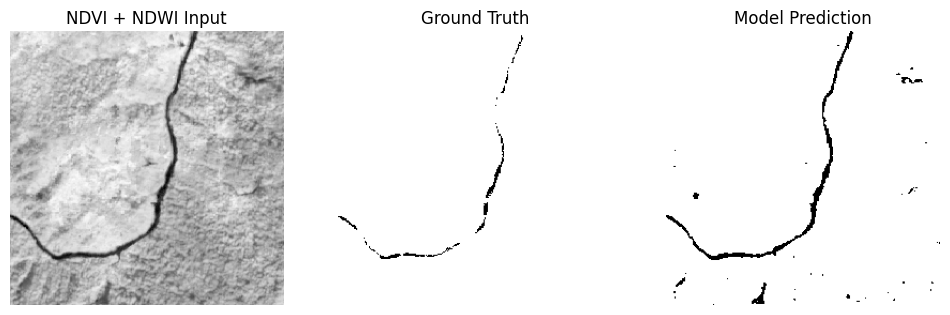

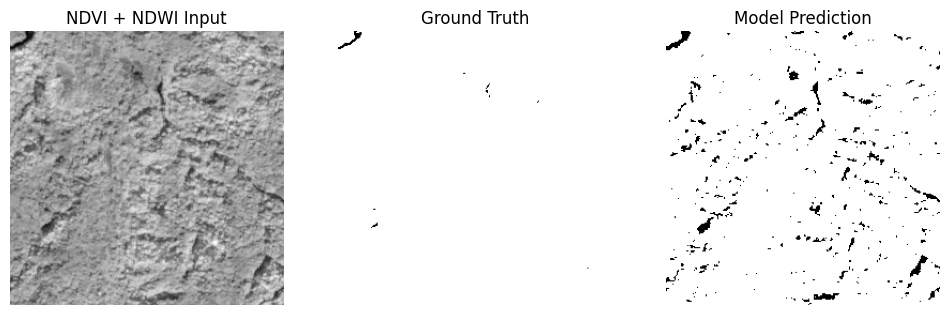

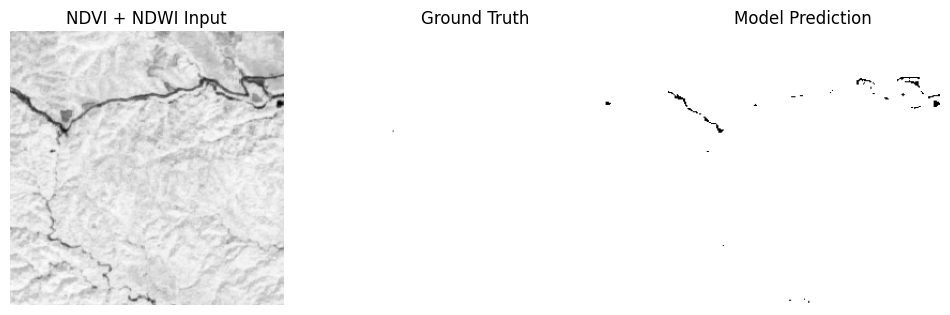

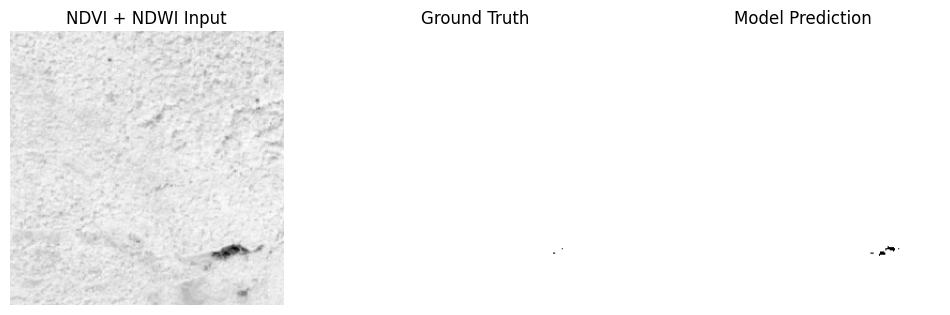

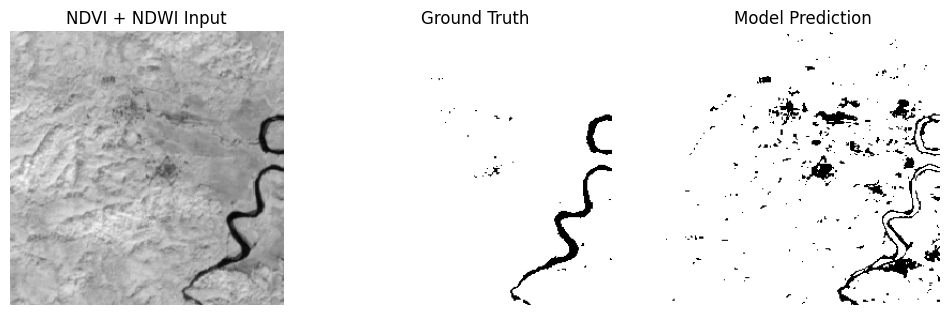

Evaluating unet_Assam_trained_final.h5 ...
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step


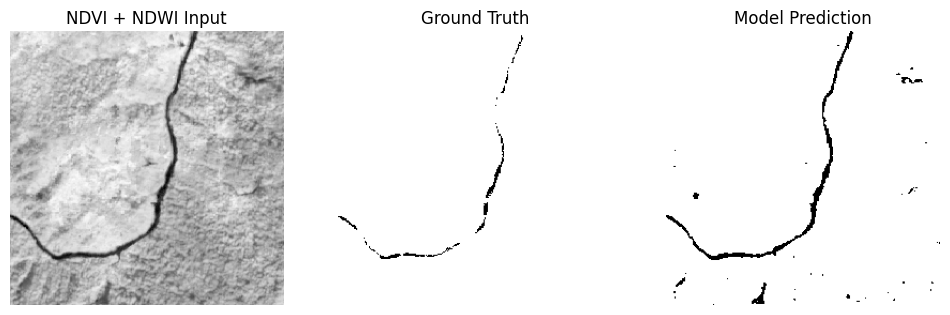

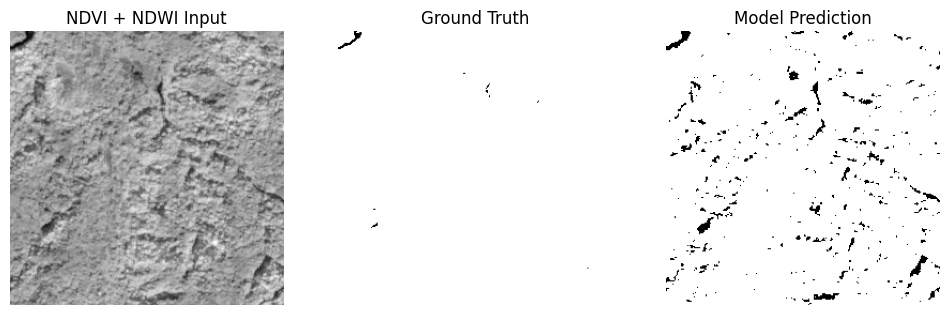

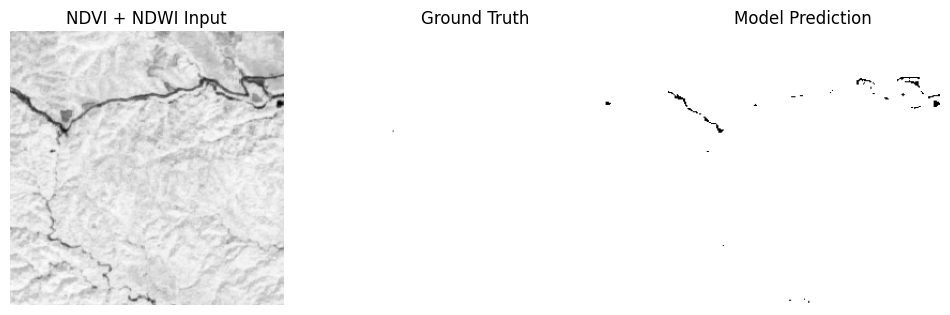

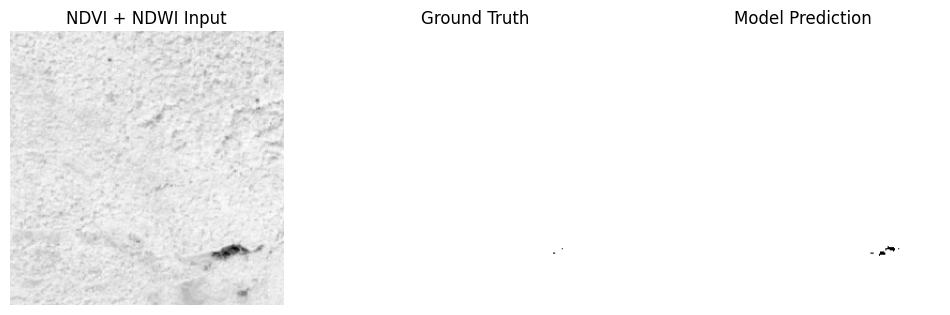

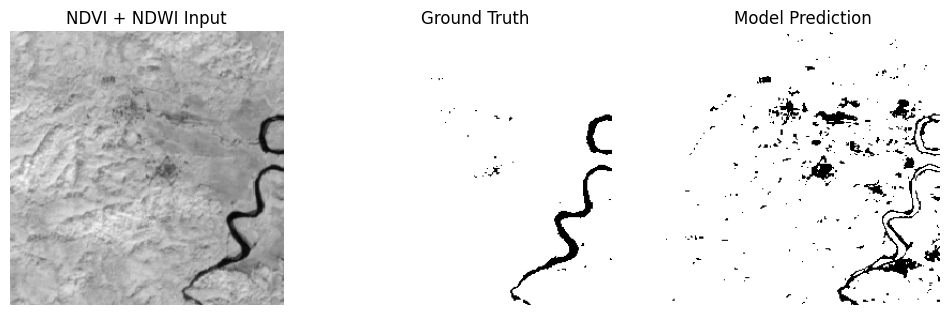

Evaluating unet_Pakke_trained_final.h5 ...
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step


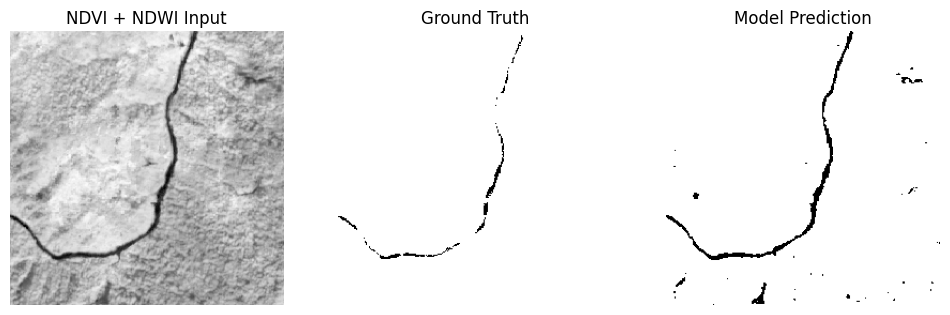

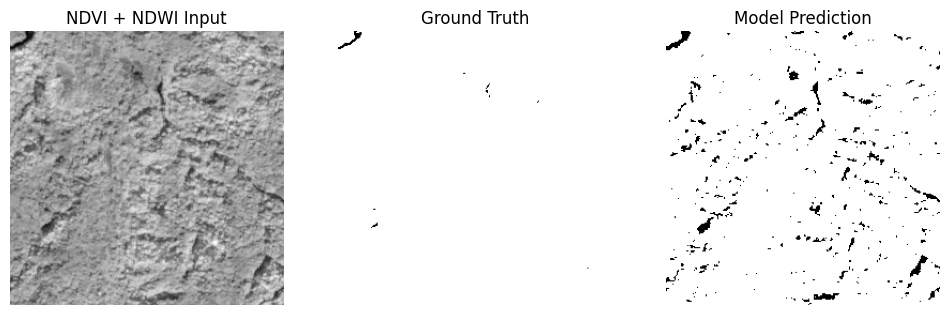

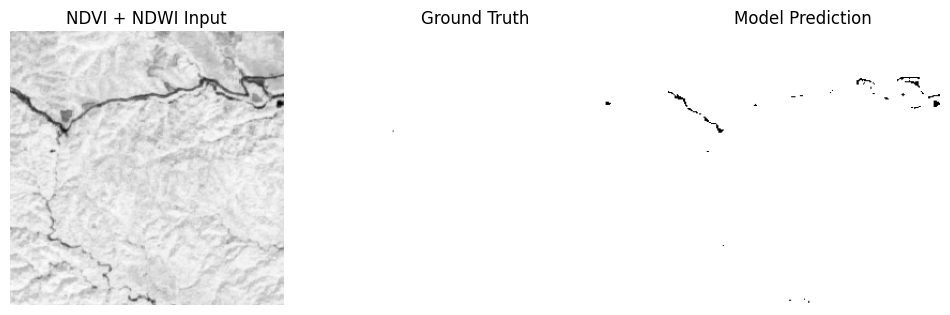

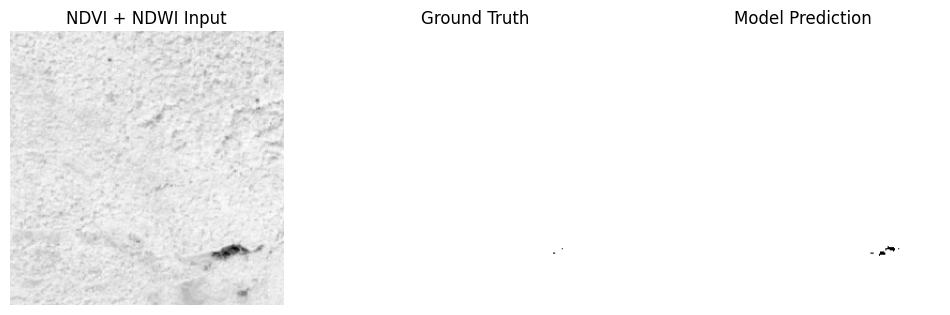

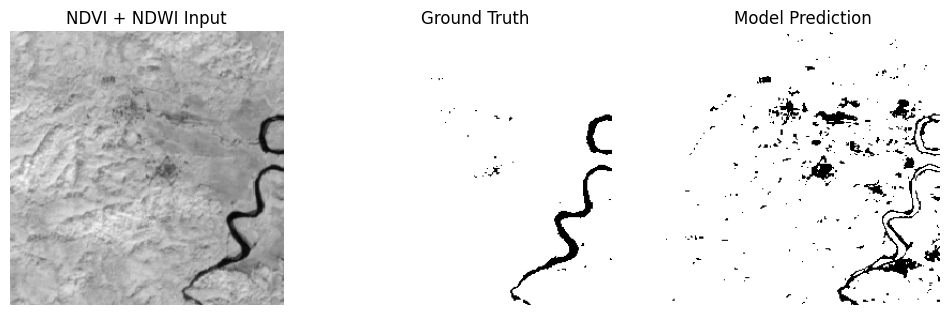

Evaluating unet_Namd_trained_final.h5 ...
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step


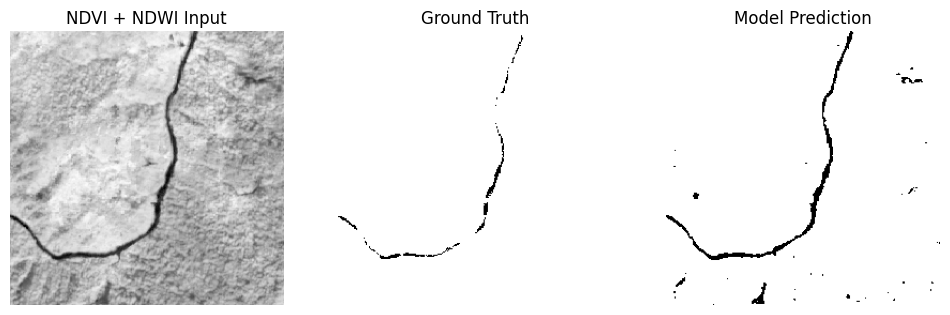

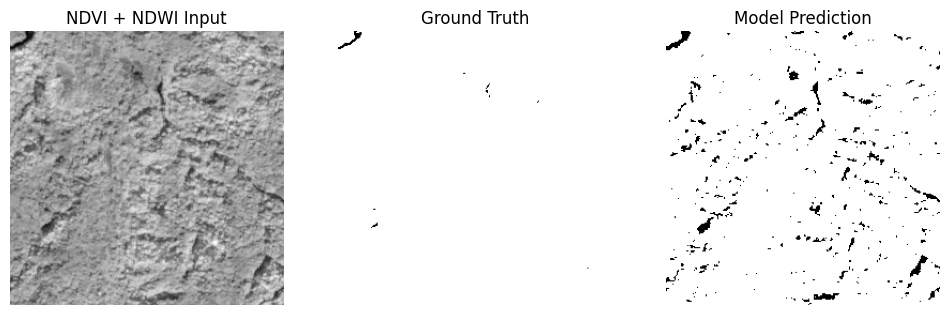

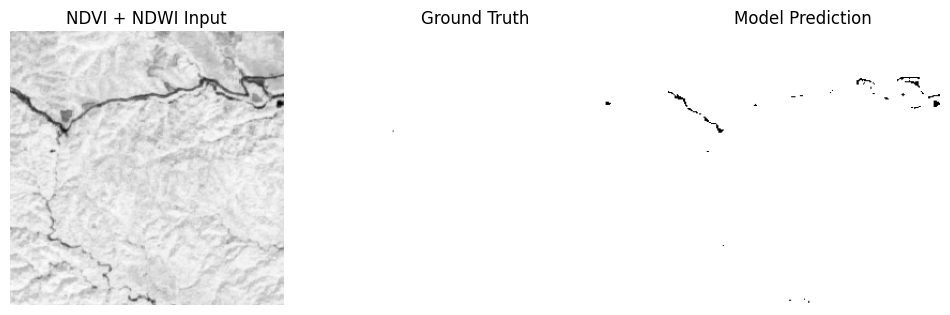

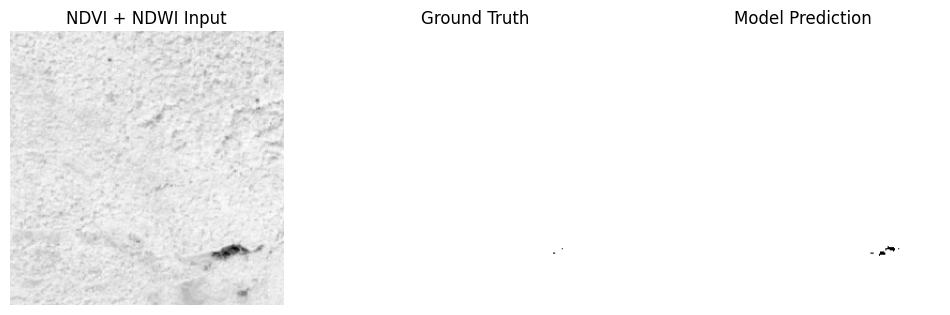

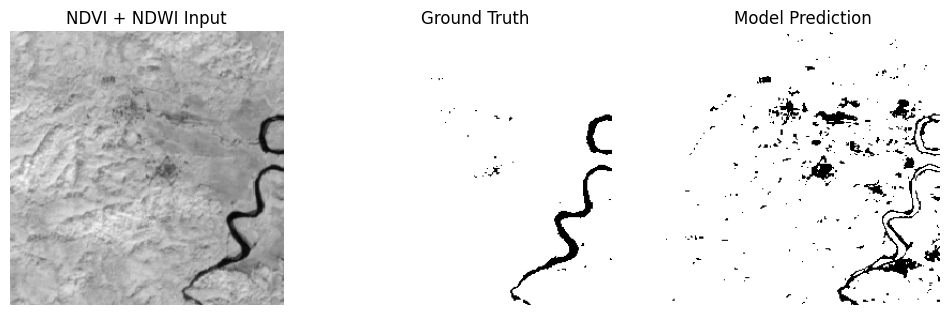

Evaluation complete! Results saved to /content/drive/MyDrive/Model_Evaluation_Results1.csv
                         Model       IoU      Dice  Precision    Recall
0          unet_final_model.h5  0.993626  0.996803   0.995265  0.998346
1  unet_Assam_trained_final.h5  0.976419  0.988069   0.976496  0.999919
2  unet_Pakke_trained_final.h5  0.905429  0.950367   0.905633  0.999751
3   unet_Namd_trained_final.h5  0.998524  0.999262   0.999325  0.999198


In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from sklearn.metrics import jaccard_score, precision_score, recall_score, f1_score
import pandas as pd

# Define paths
MODEL_DIR = "/content/drive/MyDrive/models/"  # Folder containing .h5 models
TEST_INPUT_PATH = "/content/drive/MyDrive/DataSet/Namd_test_NDVI_NDWI.npy"  # Test input (NDVI + NDWI)
TEST_LABEL_PATH = "/content/drive/MyDrive/DataSet/Namd_test_change_maps.npy"  # Ground truth labels
OUTPUT_CSV = "/content/drive/MyDrive/Model_Evaluation_Results1.csv"  # Output file

# Load test data
X_test = np.load(TEST_INPUT_PATH)
Y_test = np.load(TEST_LABEL_PATH)

# Ensure labels are binary
Y_test = (Y_test > 0.5).astype(np.uint8)

# Store evaluation results
results = []

# Function to calculate metrics
def evaluate_model(model, X_test, Y_test):
    preds = model.predict(X_test, batch_size=4)
    preds = (preds > 0.5).astype(np.uint8)  # Convert to binary output

    iou = jaccard_score(Y_test.flatten(), preds.flatten(), average='binary')
    dice = f1_score(Y_test.flatten(), preds.flatten(), average='binary')
    precision = precision_score(Y_test.flatten(), preds.flatten(), average='binary')
    recall = recall_score(Y_test.flatten(), preds.flatten(), average='binary')

    return iou, dice, precision, recall
def plot_sample(idx):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.title("NDVI + NDWI Input")
    plt.imshow(test_inputs[idx, :, :, 0], cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Ground Truth")
    plt.imshow(test_labels[idx], cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Model Prediction")
    plt.imshow(predictions[idx], cmap='gray')
    plt.axis('off')

    plt.show()

# Plot random samples

# Loop through all models in directory
for model_file in os.listdir(MODEL_DIR):
    if model_file.endswith(".h5"):
        model_path = os.path.join(MODEL_DIR, model_file)
        print(f"Evaluating {model_file} ...")

        # Load model
        model = load_model(model_path, compile=False)

        # Evaluate
        iou, dice, precision, recall = evaluate_model(model, X_test, Y_test)

        # Store results
        results.append([model_file, iou, dice, precision, recall])
        for i in range(5):
          plot_sample(i)



# Convert results to DataFrame
df = pd.DataFrame(results, columns=["Model", "IoU", "Dice", "Precision", "Recall"])

# Save to CSV
df.to_csv(OUTPUT_CSV, index=False)
print(f"Evaluation complete! Results saved to {OUTPUT_CSV}")

# Display results
print(df)


Test All models

Evaluating unet_final_model.h5 ...


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step


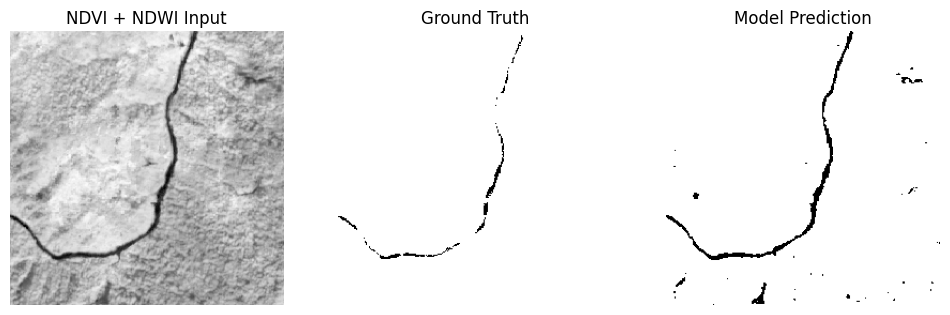

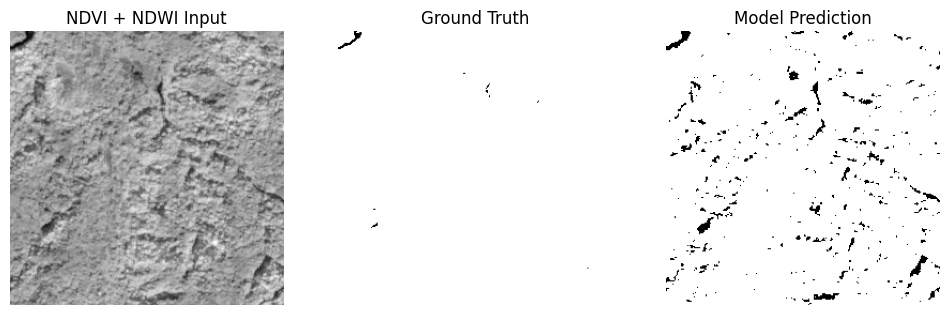

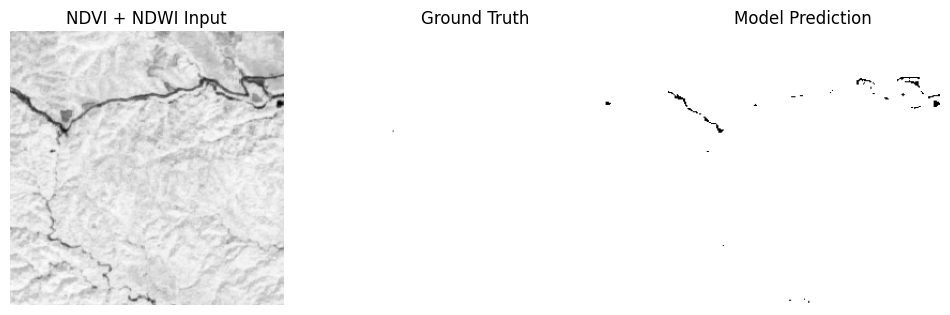

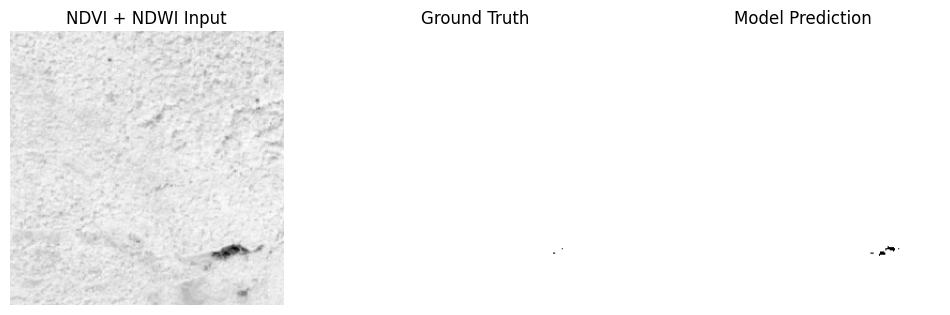

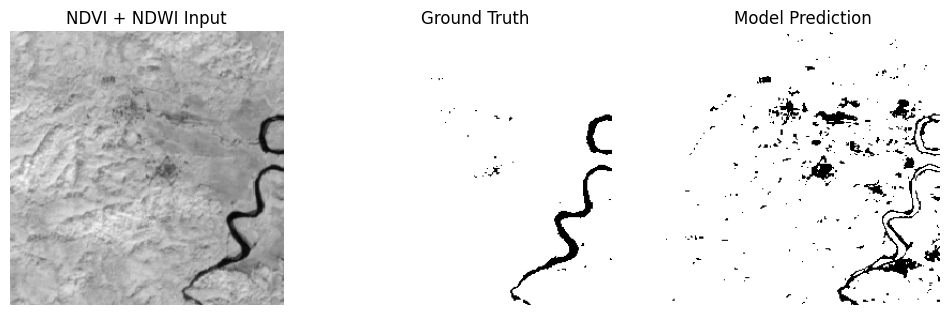

Evaluating unet_Assam_trained_final.h5 ...
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step


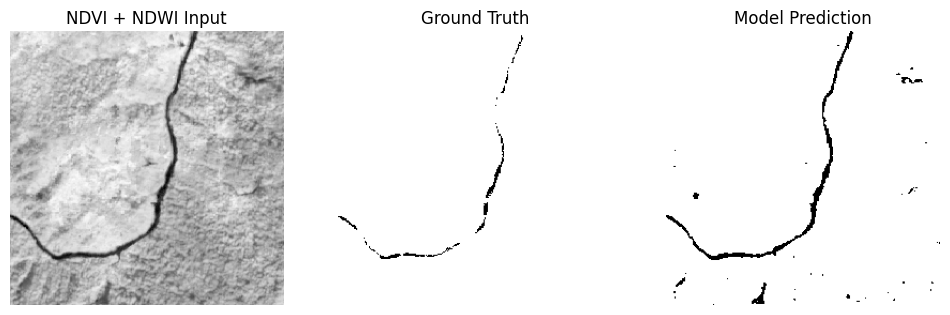

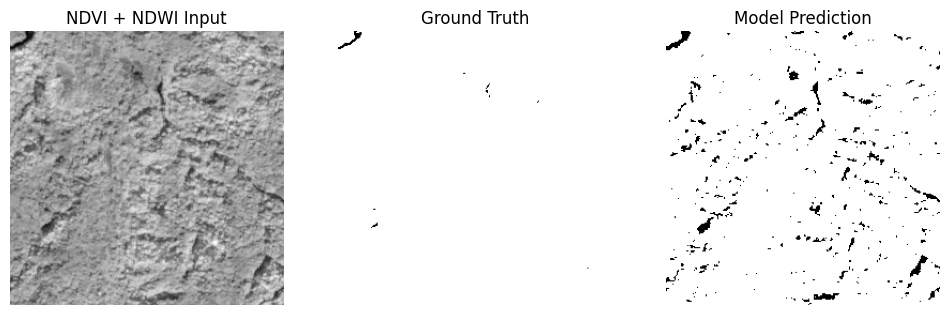

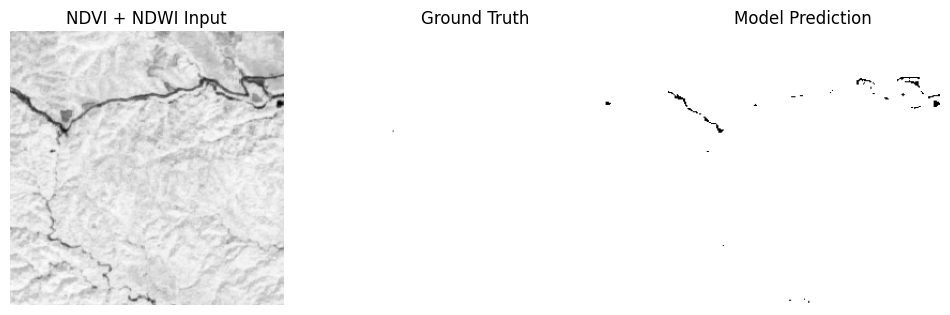

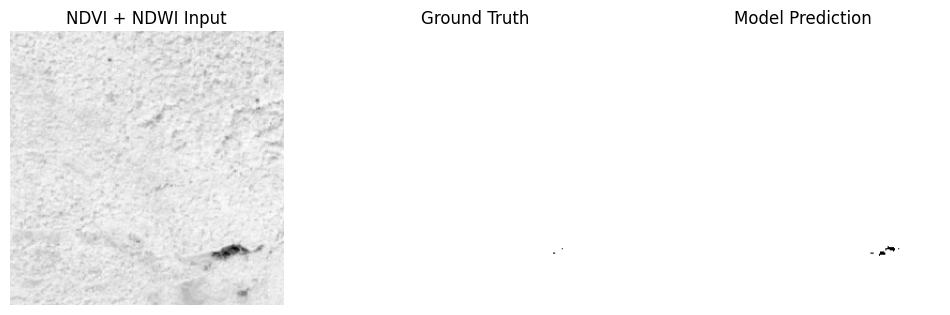

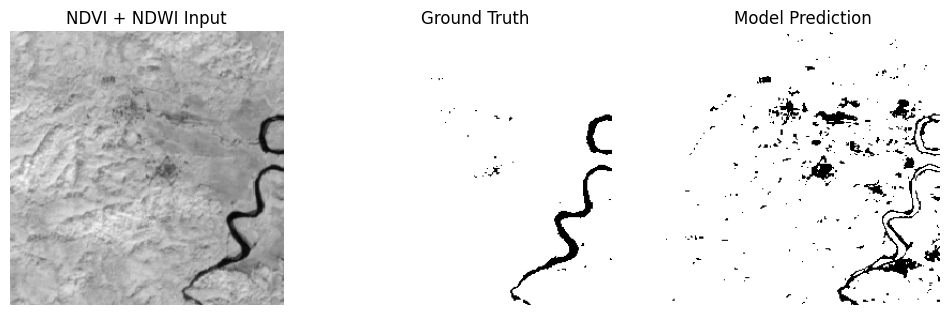

Evaluating unet_Namd_trained_final.h5 ...
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step


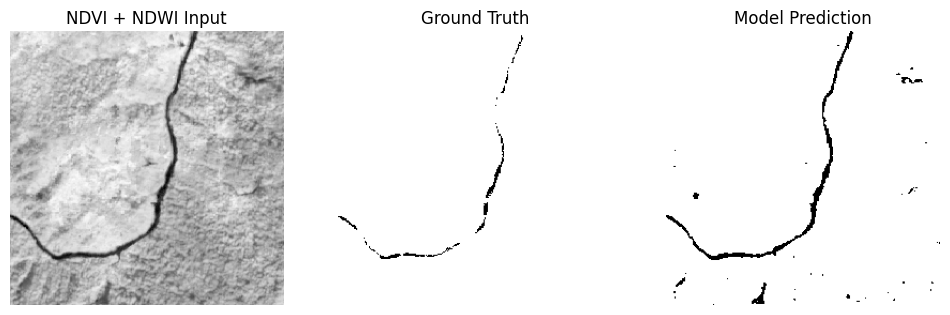

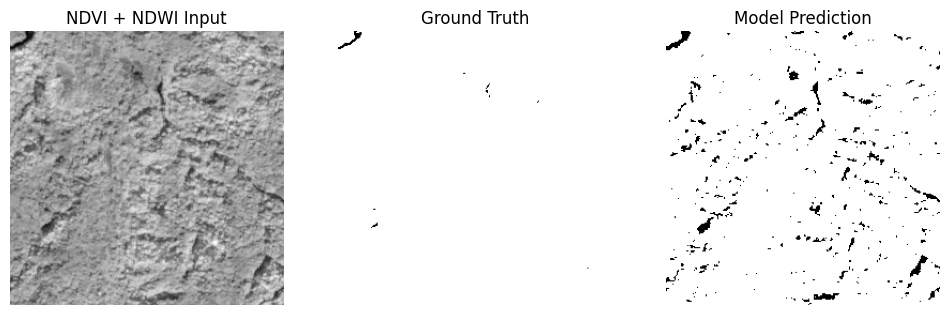

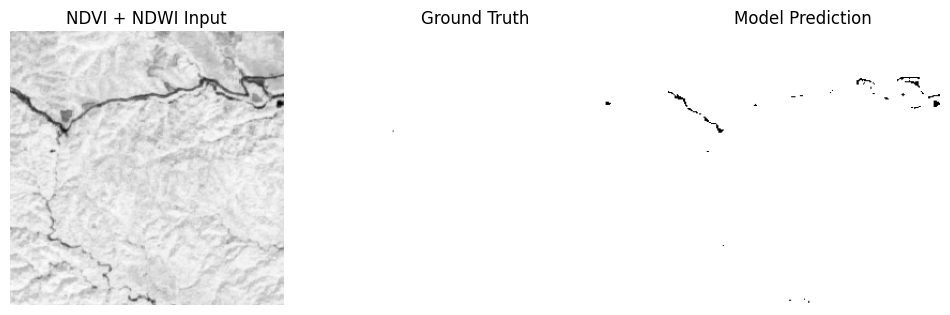

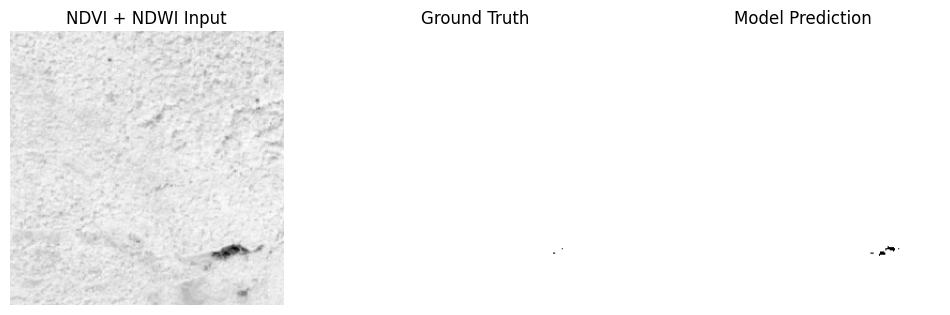

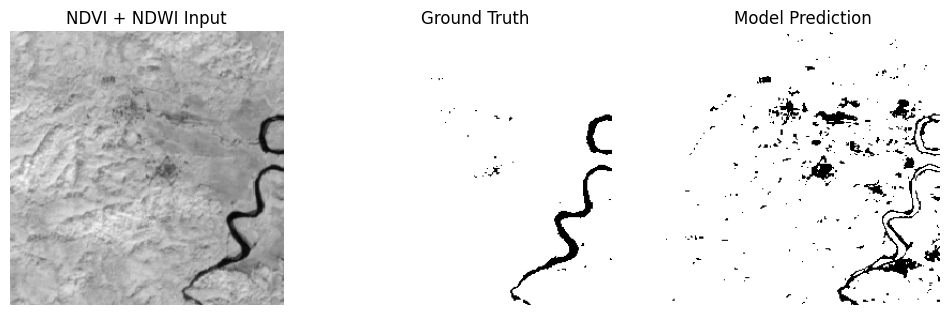

Evaluating unet_Pakke_trained_final.h5 ...
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step


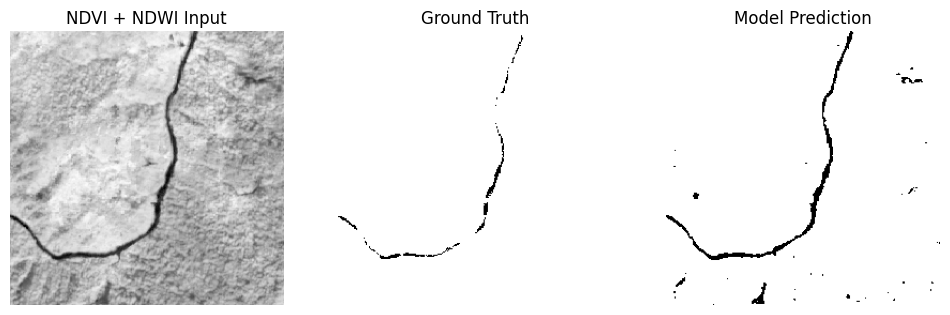

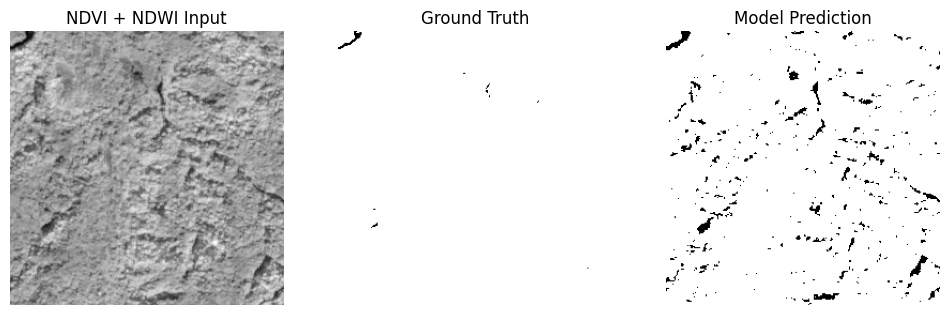

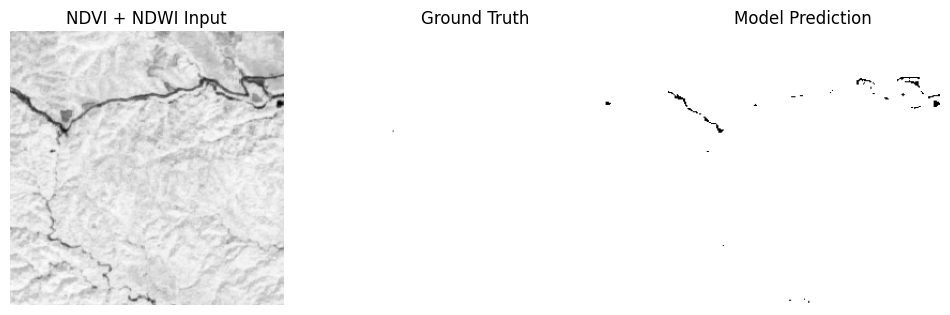

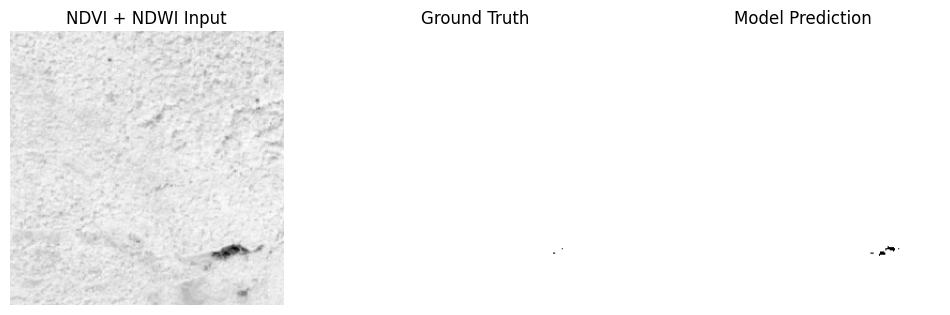

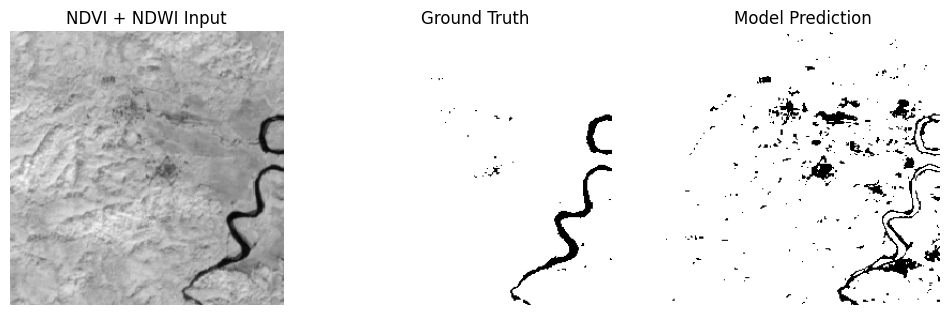

Evaluation complete! Results saved to /content/drive/MyDrive/Model_Evaluation_Results2.csv
                         Model       IoU      Dice  Precision    Recall
0          unet_final_model.h5  0.993626  0.996803   0.995265  0.998346
1  unet_Assam_trained_final.h5  0.976419  0.988069   0.976496  0.999919
2   unet_Namd_trained_final.h5  0.998524  0.999262   0.999325  0.999198
3  unet_Pakke_trained_final.h5  0.905429  0.950367   0.905633  0.999751


In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from sklearn.metrics import jaccard_score, precision_score, recall_score, f1_score
import pandas as pd
import matplotlib.pyplot as plt


# Define paths
MODEL_DIR = "/content/drive/MyDrive/models/"  # Folder containing .h5 models
TEST_INPUT_PATH = "/content/drive/MyDrive/DataSet/Namd_test_NDVI_NDWI.npy"  # Test input (NDVI + NDWI)
TEST_LABEL_PATH = "/content/drive/MyDrive/DataSet/Namd_test_change_maps.npy"  # Ground truth labels
OUTPUT_CSV = "/content/drive/MyDrive/Model_Evaluation_Results2.csv"  # Output file

# Load test data
X_test = np.load(TEST_INPUT_PATH)
Y_test = np.load(TEST_LABEL_PATH)

# Ensure labels are binary
Y_test = (Y_test > 0.5).astype(np.uint8)

# Store evaluation results
results = []

# Function to calculate metrics
def evaluate_model(model, X_test, Y_test):
    preds = model.predict(X_test, batch_size=4)
    preds = (preds > 0.5).astype(np.uint8)  # Convert to binary output

    iou = jaccard_score(Y_test.flatten(), preds.flatten(), average='binary')
    dice = f1_score(Y_test.flatten(), preds.flatten(), average='binary')
    precision = precision_score(Y_test.flatten(), preds.flatten(), average='binary')
    recall = recall_score(Y_test.flatten(), preds.flatten(), average='binary')

    return iou, dice, precision, recall
def plot_sample(idx):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.title("NDVI + NDWI Input")
    plt.imshow(test_inputs[idx, :, :, 0], cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Ground Truth")
    plt.imshow(test_labels[idx], cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Model Prediction")
    plt.imshow(predictions[idx], cmap='gray')
    plt.axis('off')

    plt.show()

# Plot random samples

# Loop through all models in directory
for model_file in os.listdir(MODEL_DIR):
    if model_file.endswith(".h5"):
        model_path = os.path.join(MODEL_DIR, model_file)
        print(f"Evaluating {model_file} ...")

        # Load model
        model = load_model(model_path, compile=False)

        # Evaluate
        iou, dice, precision, recall = evaluate_model(model, X_test, Y_test)

        # Store results
        results.append([model_file, iou, dice, precision, recall])
        for i in range(5):
          plot_sample(i)



# Convert results to DataFrame
df = pd.DataFrame(results, columns=["Model", "IoU", "Dice", "Precision", "Recall"])

# Save to CSV
df.to_csv(OUTPUT_CSV, index=False)
print(f"Evaluation complete! Results saved to {OUTPUT_CSV}")

# Display results
print(df)


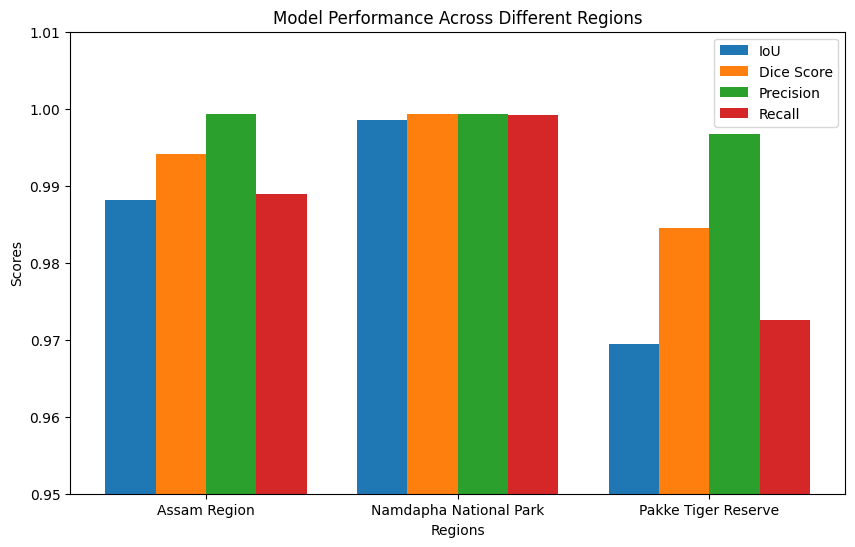

In [ ]:
# Re-import necessary libraries since execution state was reset
import numpy as np
import matplotlib.pyplot as plt

# Data for the bar chart
regions = ["Assam Region", "Namdapha National Park", "Pakke Tiger Reserve"]
metrics = ["IoU", "Dice Score", "Precision", "Recall"]
values = np.array([
    [0.9882, 0.9941, 0.9993, 0.9889],  # Assam Region
    [0.9985, 0.9993, 0.9993, 0.9992],  # Namdapha National Park
    [0.9694, 0.9845, 0.9967, 0.9726]   # Pakke Tiger Reserve
])

# Plot configuration
x = np.arange(len(regions))  # Label locations
width = 0.2  # Bar width

fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a separate bar
for i in range(len(metrics)):
    ax.bar(x + i * width, values[:, i], width, label=metrics[i])

# Labels and formatting
ax.set_xlabel("Regions")
ax.set_ylabel("Scores")
ax.set_title("Model Performance Across Different Regions")
ax.set_xticks(x + width * 1.5)
ax.set_xticklabels(regions)
ax.legend()

plt.ylim(0.95, 1.01)  # Set y-axis limits for better visualization

# Show plot
plt.show()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


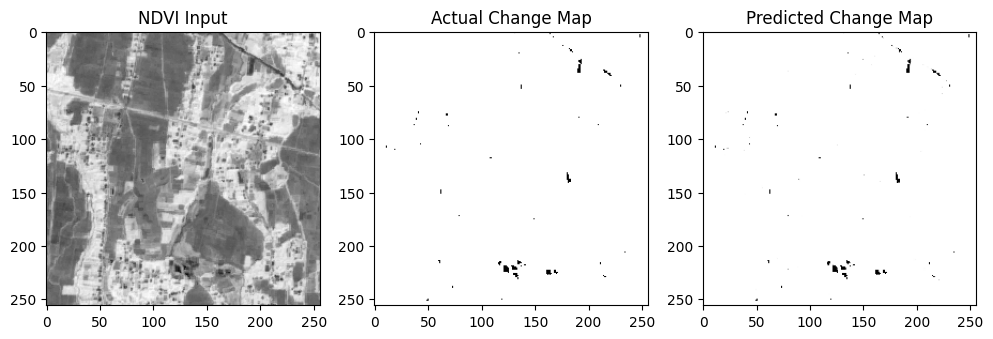

In [ ]:
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
Evaluation complete! Results saved to /content/drive/MyDrive/Model_Evaluation_Results.csv
                         Model       IoU      Dice  Precision    Recall
0          unet_final_model.h5  0.971526  0.985557   0.997463  0.973932
1  unet_Assam_trained_final.h5  0.978084  0.988920   0.997538  0.980450
2  unet_Pakke_trained_final.h5  0.999634  0.999817   0.999667  0.999968
3   unet_Namd_trained_final.h5  0.969403  0.984464   0.996672  0.972551

drive.mount('/content/drive')

# Model Load karo
model = load_model("/content/drive/MyDrive/models/unet_Assam_trained_final.h5")

# Test Data Load karo
X_test = np.load("/content/drive/MyDrive/DataSet/Assam_test_NDVI_NDWI.npy")
Y_test = np.load("/content/drive/MyDrive/DataSet/Assam_test_change_maps.npy")

# Ek random image select karo
idx = np.random.randint(0, X_test.shape[0])
test_sample = X_test[idx:idx+1]

# Model Prediction
predicted_mask = model.predict(test_sample)[0]

# Visualization
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(X_test[idx, :, :, 0], cmap="gray")
plt.title("NDVI Input")

plt.subplot(1, 3, 2)
plt.imshow(Y_test[idx, :, :], cmap="gray")
plt.title("Actual Change Map")

plt.subplot(1, 3, 3)
plt.imshow(predicted_mask, cmap="gray")
plt.title("Predicted Change Map")

plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


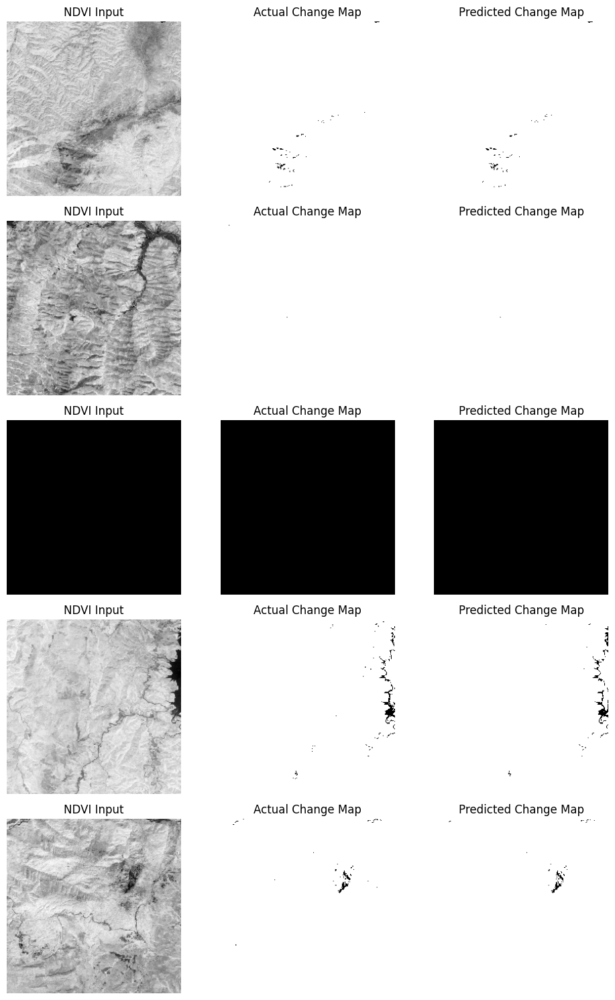

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Load the trained model
model_path = "/content/drive/MyDrive/models/unet_final_model.h5"
model = tf.keras.models.load_model(model_path, compile=False)

# Load test data
test_input_path = "/content/drive/MyDrive/DataSet/test_NDVI_NDWI.npy"
test_label_path = "/content/drive/MyDrive/DataSet/test_change_maps.npy"

X_test = np.load(test_input_path)  # NDVI & NDWI Input
Y_test = np.load(test_label_path)  # Actual Change Maps

# Normalize input
X_test = X_test / np.max(X_test)

# Select random test samples
num_samples = 5
indices = np.random.choice(len(X_test), num_samples, replace=False)

# Plot results
fig, axes = plt.subplots(num_samples, 3, figsize=(10, num_samples * 3))

for i, idx in enumerate(indices):
    input_image = X_test[idx]
    actual_change_map = np.squeeze(Y_test[idx])  # Ensure correct shape

    # Expand dimensions for prediction
    pred_change_map = model.predict(np.expand_dims(input_image, axis=0))[0]

    # Convert prediction to binary mask
    pred_change_map = (pred_change_map > 0.5).astype(np.uint8)

    # Plot the images
    axes[i, 0].imshow(input_image[..., 0], cmap='gray')
    axes[i, 0].set_title("NDVI Input")

    axes[i, 1].imshow(actual_change_map, cmap='gray')  # Fixed shape issue
    axes[i, 1].set_title("Actual Change Map")

    axes[i, 2].imshow(np.squeeze(pred_change_map), cmap='gray')  # Ensure correct shape
    axes[i, 2].set_title("Predicted Change Map")

    for ax in axes[i]:
        ax.axis("off")

plt.tight_layout()
plt.show()


Test

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Total Test Samples: 5
33/33 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step


<ipython-input-4-0f89e4e9fffe>:75: UserWarning: Glyph 128752 (\N{SATELLITE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


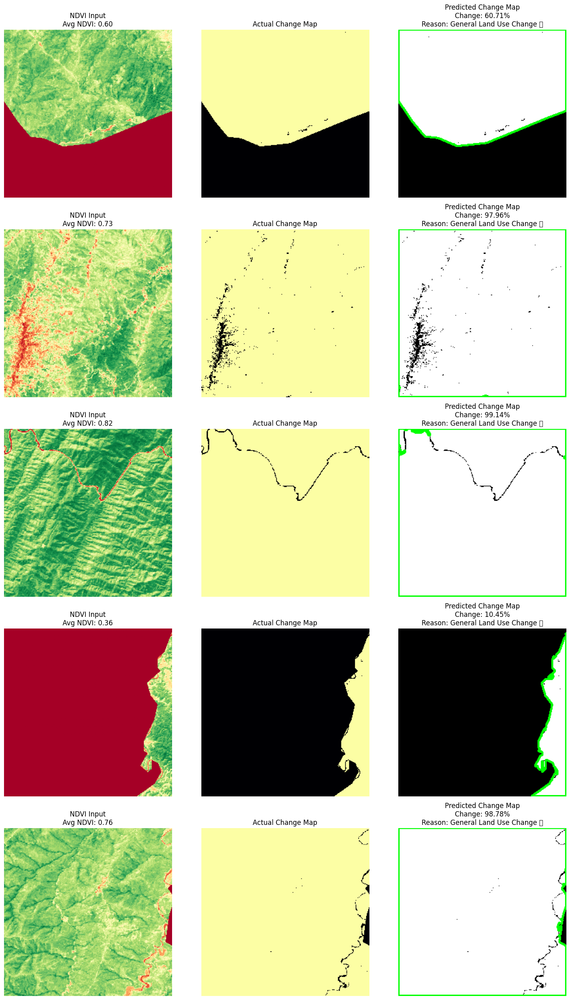

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from google.colab import drive

drive.mount('/content/drive')

# ✅ Load the trained model
model_path = "/content/drive/MyDrive/models/unet_Namd_trained_final.h5"
model = tf.keras.models.load_model(model_path, compile=False)

# ✅ Load test data (NDVI & NDWI as input)
test_input_path = "/content/drive/MyDrive/DataSet/test_NDVI_NDWI.npy"
test_label_path = "/content/drive/MyDrive/DataSet/test_change_maps.npy"

X_test = np.load(test_input_path)  # NDVI & NDWI input
Y_test = np.load(test_label_path)  # Actual Change Maps

# ✅ Normalize input data
X_test = X_test / np.max(X_test)

# ✅ Get total number of samples
total_samples = 5
print(f"✅ Total Test Samples: {total_samples}")

# ✅ Predict on all test images
predictions = model.predict(X_test, batch_size=4)

# ✅ Convert predictions to binary masks
binary_predictions = (predictions > 0.5).astype(np.uint8)

# ✅ Plot results for all samples
fig, axes = plt.subplots(total_samples, 3, figsize=(15, total_samples * 5))

for i in range(total_samples):
    change_percentage = (np.sum(Y_test[i] > 0) / Y_test[i].size) * 100
    ndvi_before = np.mean(X_test[i, ..., 0])  # NDVI Band
    ndwi_before = np.mean(X_test[i, ..., 1])  # NDWI Band

    if np.isclose(ndvi_before, 0.32, atol=0.01):
        continue  # Skip unwanted samples

    # ✅ Threshold-based Change Reasoning
    reason = "Minimal Change Detected ✅"
    if change_percentage > 5:
        if ndvi_before < 0.3:
            reason = "Deforestation or Urban Expansion 🚧"
        elif ndwi_before < 0.2:
            reason = "Water Body Reduction or Drying 💧"
        else:
            reason = "General Land Use Change 🛰️"

    # ✅ Draw contours and bounding boxes
    pred_mask = binary_predictions[i].squeeze().astype(np.uint8) * 255
    contours, _ = cv2.findContours(pred_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    pred_mask_rgb = cv2.cvtColor(pred_mask, cv2.COLOR_GRAY2BGR)
    cv2.drawContours(pred_mask_rgb, contours, -1, (0, 255, 0), 2)

    # ✅ Plot NDVI Input
    axes[i, 0].imshow(X_test[i, ..., 0], cmap="RdYlGn")
    axes[i, 0].set_title(f"NDVI Input\nAvg NDVI: {ndvi_before:.2f}")

    # ✅ Plot Actual Change Map
    axes[i, 1].imshow(Y_test[i].squeeze(), cmap="inferno")
    axes[i, 1].set_title("Actual Change Map")

    # ✅ Plot Predicted Change Map + Contours & Explanation
    axes[i, 2].imshow(pred_mask_rgb)
    axes[i, 2].set_title(f"Predicted Change Map\nChange: {change_percentage:.2f}%\nReason: {reason}")

    for ax in axes[i]:
        ax.axis("off")

plt.tight_layout()
plt.show()


NDWI


Mounted at /content/drive
✅ Total Test Samples: 5
33/33 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step


<ipython-input-1-2e95a62fd87b>:74: UserWarning: Glyph 128752 (\N{SATELLITE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-1-2e95a62fd87b>:74: UserWarning: Glyph 127754 (\N{WATER WAVE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128752 (\N{SATELLITE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127754 (\N{WATER WAVE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


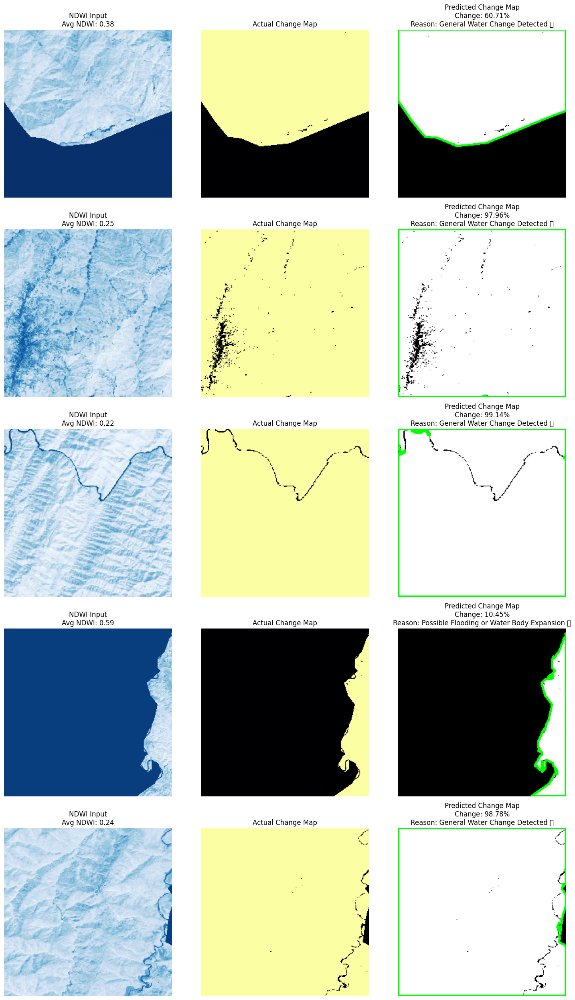

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from google.colab import drive

drive.mount('/content/drive')

# ✅ Load the trained model
model_path = "/content/drive/MyDrive/models/unet_Namd_trained_final.h5"
model = tf.keras.models.load_model(model_path, compile=False)

# ✅ Load test data (NDVI & NDWI as input)
test_input_path = "/content/drive/MyDrive/DataSet/test_NDVI_NDWI.npy"
test_label_path = "/content/drive/MyDrive/DataSet/test_change_maps.npy"

X_test = np.load(test_input_path)  # NDVI & NDWI input
Y_test = np.load(test_label_path)  # Actual Change Maps

# ✅ Normalize input data
X_test = X_test / np.max(X_test)

# ✅ Get total number of samples
total_samples = 5
print(f"✅ Total Test Samples: {total_samples}")

# ✅ Predict on all test images
predictions = model.predict(X_test, batch_size=4)

# ✅ Convert predictions to binary masks
binary_predictions = (predictions > 0.5).astype(np.uint8)

# ✅ Plot results for all samples
fig, axes = plt.subplots(total_samples, 3, figsize=(15, total_samples * 5))

for i in range(total_samples):
    change_percentage = (np.sum(Y_test[i] > 0) / Y_test[i].size) * 100
    ndwi_before = np.mean(X_test[i, ..., 1])  # NDWI Band (Now focusing on NDWI)

    if np.isclose(ndwi_before, 0.2, atol=0.01):
        continue  # Skip unwanted samples

    # ✅ Threshold-based Change Reasoning (Water-focused)
    reason = "Minimal Change in Water Bodies ✅"
    if change_percentage > 5:
        if ndwi_before > 0.5:
            reason = "Possible Flooding or Water Body Expansion 🌊"
        elif ndwi_before < 0.2:
            reason = "Water Body Shrinkage or Drying 💧"
        else:
            reason = "General Water Change Detected 🛰️"

    # ✅ Draw contours and bounding boxes
    pred_mask = binary_predictions[i].squeeze().astype(np.uint8) * 255
    contours, _ = cv2.findContours(pred_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    pred_mask_rgb = cv2.cvtColor(pred_mask, cv2.COLOR_GRAY2BGR)
    cv2.drawContours(pred_mask_rgb, contours, -1, (0, 255, 0), 2)

    # ✅ Plot NDWI Input
    axes[i, 0].imshow(X_test[i, ..., 1], cmap="Blues")
    axes[i, 0].set_title(f"NDWI Input\nAvg NDWI: {ndwi_before:.2f}")

    # ✅ Plot Actual Change Map
    axes[i, 1].imshow(Y_test[i].squeeze(), cmap="inferno")
    axes[i, 1].set_title("Actual Change Map")

    # ✅ Plot Predicted Change Map + Contours & Explanation
    axes[i, 2].imshow(pred_mask_rgb)
    axes[i, 2].set_title(f"Predicted Change Map\nChange: {change_percentage:.2f}%\nReason: {reason}")

    for ax in axes[i]:
        ax.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import jaccard_score, f1_score

# Load the trained model
model_path = "/content/drive/MyDrive/models/unet_final_model.h5"
model = tf.keras.models.load_model(model_path, compile=False)

# Load test data
test_input_path = "/content/drive/MyDrive/DataSet/test_NDVI_NDWI.npy"
test_label_path = "/content/drive/MyDrive/DataSet/test_change_maps.npy"

X_test = np.load(test_input_path)  # NDVI & NDWI Input
Y_test = np.load(test_label_path)  # Actual Change Maps

# Normalize input
X_test = X_test / np.max(X_test)

# Initialize lists to store IoU and Dice scores
iou_scores = []
dice_scores = []

# Iterate over all test samples
for i in range(len(X_test)):
    input_image = X_test[i]
    actual_change_map = np.squeeze(Y_test[i])  # Ensure correct shape

    # Expand dimensions for prediction
    pred_change_map = model.predict(np.expand_dims(input_image, axis=0))[0]

    # Convert prediction to binary mask (Threshold = 0.5)
    pred_change_map = (pred_change_map > 0.5).astype(np.uint8)
    pred_change_map = np.squeeze(pred_change_map)  # Ensure correct shape

    # Flatten arrays for metric calculation
    y_true = actual_change_map.flatten()
    y_pred = pred_change_map.flatten()

    # Skip samples with all zeros (no change detected)
    if np.sum(y_true) == 0 and np.sum(y_pred) == 0:
        continue  # Skip this sample

    # Calculate IoU (Jaccard Index) with `zero_division=1`
    iou = jaccard_score(y_true, y_pred, average="binary", zero_division=1)
    iou_scores.append(iou)

    # Calculate Dice Score (F1 Score for segmentation) with `zero_division=1`
    dice = f1_score(y_true, y_pred, average="binary", zero_division=1)
    dice_scores.append(dice)

# Compute overall IoU and Dice Score
mean_iou = np.mean(iou_scores) if iou_scores else 0
mean_dice = np.mean(dice_scores) if dice_scores else 0
plt.tight_layout()
plt.show()

print(f"Average IoU Score: {mean_iou:.4f}")
print(f"Average Dice Score: {mean_dice:.4f}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━

<Figure size 640x480 with 0 Axes>

Average IoU Score: 0.9962
Average Dice Score: 0.9981


Prediction Save

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import os

# Load the trained model
model_path = "/content/drive/MyDrive/models/unet_final_model.h5"
model = tf.keras.models.load_model(model_path, compile=False)

# Load test data
test_input_path = "/content/drive/MyDrive/DataSet/test_NDVI_NDWI.npy"
test_label_path = "/content/drive/MyDrive/DataSet/test_change_maps.npy"

X_test = np.load(test_input_path)  # NDVI & NDWI Input
Y_test = np.load(test_label_path)  # Actual Change Maps

# Normalize input
X_test = X_test / np.max(X_test)

# Create directory to save results
output_dir = "/content/drive/MyDrive/Predictions/"
os.makedirs(output_dir, exist_ok=True)

# Iterate over all test samples
for idx in range(len(X_test)):
    input_image = X_test[idx, ..., 0]  # NDVI Input
    actual_change_map = np.squeeze(Y_test[idx])  # Ground truth

    # Predict change map
    pred_change_map = model.predict(np.expand_dims(X_test[idx], axis=0))[0]

    # Convert prediction to binary mask
    pred_change_map = (pred_change_map > 0.5).astype(np.uint8)

    # Plot images
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    axes[0].imshow(input_image, cmap='gray')
    axes[0].set_title("NDVI Input")

    axes[1].imshow(actual_change_map, cmap='gray')
    axes[1].set_title("Actual Change Map")

    axes[2].imshow(np.squeeze(pred_change_map), cmap='gray')
    axes[2].set_title("Predicted Change Map")

    for ax in axes:
        ax.axis("off")

    plt.tight_layout()

    # Save figure
    save_path = os.path.join(output_dir, f"sample_{idx+1}.png")
    plt.savefig(save_path, bbox_inches='tight')
    plt.close()

print(f"All visualizations saved in: {output_dir}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━

Confusion Matrix

26/26 ━━━━━━━━━━━━━━━━━━━━ 52s 1s/step


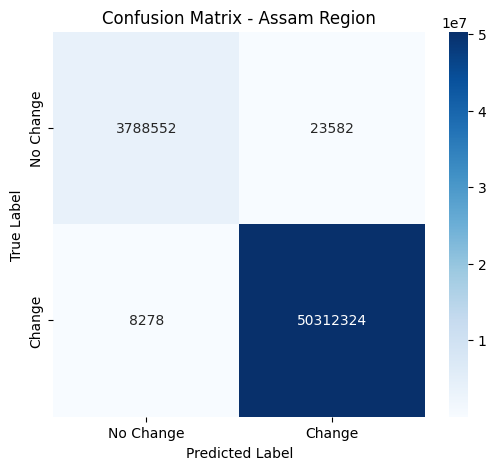

✅ Confusion Matrix Generated Successfully!


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from sklearn.metrics import confusion_matrix

# ✅ Load trained model (update path based on the model you want to test)
model_path = "/content/drive/MyDrive/models/unet_Assam_trained_final.h5"  # Change for other models
model = tf.keras.models.load_model(model_path, compile=False)

# ✅ Dataset paths (NDVI + NDWI & Change Maps)
test_input_path = "/content/drive/MyDrive/DataSet/Assam_test_NDVI_NDWI.npy"
test_labels_path = "/content/drive/MyDrive/DataSet/Assam_test_change_maps.npy"

# ✅ Load dataset
X_test = np.load(test_input_path)  # Input (NDVI + NDWI)
Y_test = np.load(test_labels_path)  # Ground Truth Change Maps

# ✅ Normalize test inputs (0 to 1)
X_test = X_test / np.max(X_test)

# ✅ Generate model predictions
Y_pred = model.predict(X_test)  # Raw Predictions
Y_pred = (Y_pred > 0.5).astype(np.uint8)  # Convert to binary mask (Threshold = 0.5)
Y_test = (Y_test > 0.5).astype(np.uint8)  # Ensure ground truth is binary

# ✅ Compute Confusion Matrix
cm = confusion_matrix(Y_test.flatten(), Y_pred.flatten(), labels=[0, 1])

# ✅ Plot Confusion Matrix as Heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["No Change", "Change"], yticklabels=["No Change", "Change"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title(f"Confusion Matrix - Assam Region")
plt.show()

print("✅ Confusion Matrix Generated Successfully!")
